# Sinor Project
## Rice Dectection
In this project, it about classifly rices gain.

In [1]:
import cv2
import math
import time
import numpy as np
import random as rng
import csv
from matplotlib import pyplot as plt
from ipywidgets import interact
import ipywidgets as widgets
from IPython.display import display, HTML,clear_output
%matplotlib inline

## Read File Path

In [2]:
import os, fnmatch
def filePath(path="05.11.61"):
    paths = "assets/" + path + "/"
    pattern = "*[.JPG,.png]"
    list = []
    for file in os.listdir(paths):
        if fnmatch.fnmatch(file, pattern):
            list.append(paths+file)
    return list

## Color Segment

## Plot Histrogram

In [3]:
def plotHist(inputImage,cvt='rgb',w=False):
    color = (cvt[0],cvt[1],cvt[2])
    data = []
    for i,col in enumerate(color):
        histr = cv2.calcHist([inputImage],[i],None,[256],[0,256])
        plt.plot(histr,color = col)
        data.append(histr)
        plt.xlim([0,256])
    plt.show()
    
#  Write File
    if w :
        myFile = open('example2.csv', 'w')
        with myFile:
            writer = csv.writer(myFile)
            writer.writerows(data)

## Plot Image

In [4]:
global riceImage,riceImageWB,mask
def plotImage(inputImage,path=False):
    inputImageGray = cv2.cvtColor(inputImage, cv2.COLOR_BGR2GRAY)
    riceImage = cv2.cvtColor(inputImage,cv2.COLOR_BGR2RGB)
    riceImageWB = whiteBalance(inputImage)
    riceImageWBGray = cv2.cvtColor(riceImageWB, cv2.COLOR_BGR2GRAY)
    riceImageWBGray = cv2.blur(riceImageWBGray,(15,15))
    
    _hMin,_sMin,_vMin = 0, 48, 80
    _hMax,_sMax,_vMax = 20, 255, 255
    riceImageHSV = cv2.cvtColor(inputImage,cv2.COLOR_BGR2HSV)
    mask = cv2.inRange(riceImageHSV,(_hMin,_sMin,_vMin),(_hMax,_sMax,_vMax))
    riceOutput = cv2.bitwise_and(riceImage,riceImage,mask = mask)

    plt.figure(figsize=(10,10))
    plt.title('Rice Image')
    plt.imshow(riceImage,cmap='gray')
    plt.show()

    plt.figure(figsize=(10,10))
    plt.title('Rice Image With WhiteBalance')
    riceImageWB = cv2.cvtColor(riceImageWB, cv2.COLOR_BGR2RGB)
    plt.imshow(riceImageWB,cmap='gray')
    plt.show()
    
    plt.figure(figsize=(10,10))
    plt.title('Segmentation')
    plt.imshow(mask, cmap='gray')
    plt.show()
    
    plt.title('Histogram Of WhiteBalance Rice Image')
    plotHist(riceImageWB)
    if path :
        riceImageWB = cv2.cvtColor(riceImageWB, cv2.COLOR_BGR2RGB)
        cv2.imwrite(path+'_riceWhiteBalance.jpg',riceImageWB)
        cv2.imwrite(path+'_segmentation.jpg',mask)

## Plot Image Throshould

In [5]:
def plotImageByThroshold(inputImage,path=False):
    inputImageGray = cv2.cvtColor(inputImage, cv2.COLOR_BGR2GRAY)
    riceImage = cv2.cvtColor(inputImage,cv2.COLOR_BGR2RGB)
    riceImageWB = whiteBalance(inputImage)
    riceImageWBGray = cv2.cvtColor(riceImageWB, cv2.COLOR_BGR2GRAY)
#     riceImageWBGray = cv2.blur(riceImageWBGray,(15,15))
    
    mask = cv2.threshold(riceImageWBGray,0,255,cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]
    # noise removal
    kernel = np.ones((3,3),np.uint8)
    mask = cv2.morphologyEx(mask,cv2.MORPH_OPEN,kernel, iterations = 2)
    # sure background area
    sure_bg = cv2.dilate(mask,kernel,iterations=3)

    riceImageWB = cv2.cvtColor(riceImageWB, cv2.COLOR_BGR2RGB)
    riceOutput = cv2.bitwise_and(riceImageWB,riceImageWB,mask = mask)

    plt.figure(figsize=(10,10))
    plt.title('Rice Image')
    plt.imshow(riceImage,cmap='gray')
    plt.show()

    plt.figure(figsize=(10,10))
    plt.title('Rice Image With WhiteBalance')
    plt.imshow(riceImageWB,cmap='gray')
    plt.show()
    
    plt.figure(figsize=(10,10))
    plt.title('Segmentation')
    plt.imshow(mask, cmap='gray')
    plt.show()
    
    plt.figure(figsize=(10,10))
    plt.title('Rice Segment')
    plt.imshow(riceOutput, cmap='gray')
    plt.show()
    
    plt.title('Histogram Of WhiteBalance Rice Image')
    plotHist(riceImageWB)
    if path :
        riceImageWB = cv2.cvtColor(riceImageWB, cv2.COLOR_BGR2RGB)
        riceOutput = cv2.cvtColor(riceOutput, cv2.COLOR_BGR2RGB)
        cv2.imwrite(path[:-4]+'_riceWhiteBalance.jpg',riceImageWB)
        cv2.imwrite(path[:-4]+'_segmentation.jpg',mask)
        cv2.imwrite(path[:-4]+'_riceSegmentation.jpg',riceOutput)

## Color Correction

RGBratio = [1.         0.99544602 1.04895222]


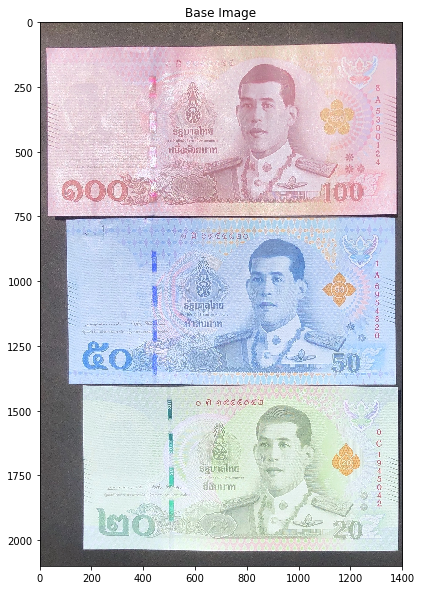

RGBratioAfterCC = [1.         0.99268065 1.04610551]


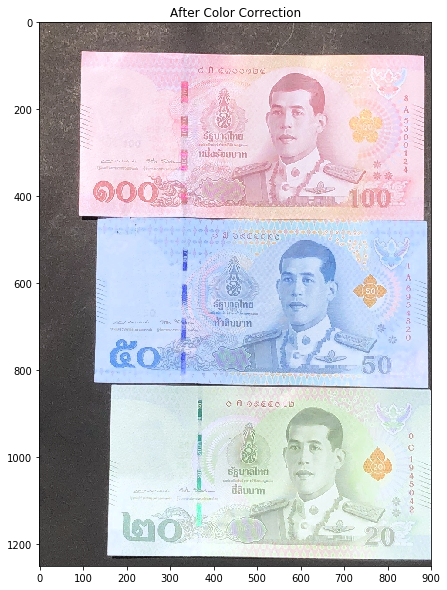

CPU times: user 1.68 s, sys: 246 ms, total: 1.92 s
Wall time: 1.8 s


In [17]:
%%time
def avgColor(img, thredL=0, thredU=256):
    avg_img = np.array(img)
    avg_img = avg_img.astype('float')
#     r = avg_img[:,:,0]
#     g = avg_img[:,:,1]
#     b = avg_img[:,:,2]
#     avg_color = [np.average(r[r!=0]),
#                  np.average(g[g!=0]),
#                  np.average(b[b!=0])]
    avg_img[(avg_img == 0) | (avg_img < thredL) | (thredU < avg_img)] = np.nan
    avg_img_row = np.nanmean(avg_img, axis=0)
    avg_color = np.nanmean(avg_img_row, axis=0)
    return avg_color

np.seterr(divide='ignore', invalid='ignore')
baseImg = cv2.imread(filePath('07.03.62')[-3])
baseImg = cv2.cvtColor(baseImg, cv2.COLOR_BGR2RGB)
baseImg = baseImg[800:2900,500:1900]
avgBase = avgColor(baseImg)
print('RGBratio =',avgBase/avgBase[0])
plt.figure(figsize=(10,10))
plt.title('Base Image')
plt.imshow(baseImg)
plt.show()

def colorCorrection(img, avgRGB):
#     plt.figure(figsize=(10,10))
#     plt.title('Original Image')
#     plt.imshow(img)
#     plt.show()
    RGBBase = np.array(avgBase)
    RGBRaw = np.array(avgRGB)
    RGBBase = RGBBase/RGBBase[0]
    RGBRaw = RGBRaw/RGBRaw[0]
    RGBFactor = RGBBase/RGBRaw
#     print('RGBFactor = ',RGBFactor)
    imgCC = np.array(img)
    # RGB
    red = np.copy(imgCC[:,:,0])
    greenFactor = RGBFactor[1]
    green = imgCC[:,:,1] * greenFactor
    blueFactor = RGBFactor[2]
    blue = imgCC[:,:,2] * blueFactor
    # Green
    imgCC[:,:,1] = np.where(blue > 255, (255/blue)*green, green)
    imgCC[:,:,1] = np.where((green > 255) & (green >= blue),255, imgCC[:,:,1])
    # Blue
    imgCC[:,:,2] = np.where(green > 255, (255/green)*blue, blue)
    imgCC[:,:,2] = np.where((blue > 255) & (blue >= green),255, imgCC[:,:,2])
    # Red
    imgCC[:,:,0] = np.where((green > 255) | (blue > 255), 
                            np.where(green > blue, (255/green)*red , (255/blue)*red), red)
    avgRGB = avgColor(imgCC)
    print('RGBratioAfterCC =',avgRGB/avgRGB[0])
    plt.figure(figsize=(10,10))
    plt.title('After Color Correction')
    plt.imshow(imgCC)
    plt.show()
    
    return imgCC

img = cv2.imread(filePath('07.03.62')[0])
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
rawImg = img[1000:2250,1700:2600]
colorCorrection(rawImg,avgColor(img[1000:2250,1700:2600]))

## Plot Connected Components

In [18]:
def deleteSmall(inputImg, size):
        nb_components, output, stats, centroids = cv2.connectedComponentsWithStats(inputImg, connectivity=8)
        sizes = stats[1:, -1]; nb_components = nb_components - 1
        
        min_size = size  

        img = np.zeros((inputImg.shape), np.uint8)
        #for every component in the image, you keep it only if it's above min_size
        for i in range(0, nb_components):
            if sizes[i] >= min_size:
                img[output == i + 1] = 255
        return img

def auto_canny(image, sigma=0.33):
    # compute the median of the single channel pixel intensities
    v = np.median(image)
 
    # apply automatic Canny edge detection using the computed median
    lower = int(max(0, (1.0 - sigma) * v))
    upper = int(min(255, (1.0 + sigma) * v))
    edged = cv2.Canny(image, lower, upper)
 
    # return the edged image
    return edged

def plotConnectedComponents(input_BGR, kValue=17, show_process=True):
    cropImage = input_BGR
    riceImage = cv2.cvtColor(cropImage,cv2.COLOR_BGR2RGB)
    riceImageGray = cv2.cvtColor(cropImage, cv2.COLOR_BGR2GRAY)

    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(kValue,kValue))
    opening = cv2.morphologyEx(riceImageGray,cv2.MORPH_OPEN,kernel, iterations = 2)

    I2 = riceImageGray - opening

    mask = cv2.threshold(I2,0,255,cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(3,3))
    mask2 = cv2.morphologyEx(mask,cv2.MORPH_OPEN,kernel, iterations = 1)
    
    mask = deleteSmall(mask2, 300)
    
    stackImg = np.concatenate((riceImageGray, mask), axis=1)
    
    if show_process:
        plt.figure(figsize=(10,10))
        plt.title('After Opening')
        plt.imshow(mask2, cmap = 'gray')
        plt.show()
        plt.imshow(stackImg, cmap = 'gray')
        plt.show()
    
    # sure background area
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(1,1))
    sure_bg = cv2.dilate(mask,kernel,iterations=3)

    riceOutput = cv2.bitwise_and(riceImage,riceImage,mask = mask)
    
    distanceTransformOutput = cv2.distanceTransform(mask,cv2.DIST_L2,3)
    if show_process:
        plt.figure(figsize=(10,10))
        plt.title('distanceTransformOutput')
        plt.imshow(distanceTransformOutput,cmap='gray')
        plt.show()
    
    maxDistance = np.max(distanceTransformOutput)
    if show_process:
        print('Max Distance:',maxDistance)
    roughMarkerPixel = np.uint8(distanceTransformOutput > 0.45 * maxDistance)
    roughMarkerPixel = deleteSmall(roughMarkerPixel,20)
    
    unknown = cv2.subtract(sure_bg,roughMarkerPixel)
    
    if show_process:
        plt.figure(figsize=(10,10))
        plt.title('Background')
        plt.imshow(sure_bg, cmap='gray')
        plt.show()

        plt.figure(figsize=(10,10))
        plt.title('Foreground')
        plt.imshow(roughMarkerPixel, cmap='gray')
        plt.show()
    
        plt.figure(figsize=(10,10))
        plt.title('unknown')
        plt.imshow(unknown, cmap='gray')
        plt.show()
    
    _, markers = cv2.connectedComponents(roughMarkerPixel)
    # Add 1 to make the marker label start with 1
    markers = markers+1

    # Mark background pixel with 0
    markers[unknown==255] = 0
    if show_process:
        plt.figure(figsize=(10,10))
        plt.title('Mark background pixel with 0')
        plt.imshow(markers,cmap='jet')
        plt.show()
    
    outputImage = cropImage.copy()
    borderImage = cropImage.copy()

    markers = cv2.watershed(outputImage,markers)
    outputImage = cv2.cvtColor(outputImage,cv2.COLOR_BGR2RGB)
    riceColors = {}
    
    # 1 is background 
    for outputMarkerIdx in range(2,np.max(markers+1)):
        color = (rng.randint(0,256), rng.randint(0,256), rng.randint(0,256))
        riceColors[outputMarkerIdx-1] = outputImage[np.where(markers == outputMarkerIdx)].copy()
        outputImage[np.where(markers == outputMarkerIdx)] = color
    if show_process:
        plt.figure(figsize=(10,10))
        plt.title('Segmentation Result')
        plt.imshow(outputImage)
        plt.show()
    
    
    borderImage[np.where(markers == -1)] = (0,255,0)
    borderImage = cv2.cvtColor(borderImage,cv2.COLOR_BGR2RGB)
    if show_process:
        plt.figure(figsize=(10,10))
        plt.title('Segmentation Boundary')
        plt.imshow(borderImage)
        plt.show()
        print('Count:',np.max(markers)-1)
    
    
    # Label
    finalImage = riceImage.copy()
    for label in np.unique(markers):
        # if the label is zero, we are examining the 'background'
        # so simply ignore it
        if label == 0 or label == -1 or label == 1:
            continue
        color = (rng.randint(0,256/2), rng.randint(0,256/2), rng.randint(0,256/2))
        colorText = (rng.randint(256/2,256), rng.randint(256/2,256), rng.randint(256/2,256))
        # otherwise, allocate memory for the label region and draw
        # it on the mask
        mask = np.zeros(riceImageGray.shape, dtype="uint8")
        mask[markers == label] = 255
        cnts = cv2.findContours(mask.copy(), cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)[-2]
        # Setup Text
        font = cv2.FONT_HERSHEY_SIMPLEX
        text = "#{} ".format(label-1)

        # get boundary of this text
        textsize = cv2.getTextSize(text, font, 0.7, 1)[0]

        for cnt in cnts:
            x, y, w, h = cv2.boundingRect(cnt)
            cv2.drawContours(finalImage, cnts, 0, color,5)
            # cv2.rectangle(finalImage, (x,y),(x+w,y+h), color, 2)
            textX = x + (w - textsize[0]) / 2
            textY = y + (h + textsize[1]) / 2
            cv2.putText(finalImage, text, (int(textX), int(textY)),font, 0.7, colorText, 1)

    avg_color = []
    w = False
    #  Write File
    if w :
        myFile = open('riceColorRedData.csv', 'w')
        with myFile:
            writer = csv.writer(myFile)
            for i in range(len(riceColors)):
                writer.writerows(np.transpose(riceColors[i+1]))

    for i in range(len(riceColors)):
        mean_color = np.mean(riceColors[i+1], axis=0)
        print('#',i+1,'Area :',len(riceColors[i+1]),'px | RGB :',mean_color)
        avg_color.append(mean_color)
    
    if show_process:
        plt.figure(figsize=(10,10))
        plt.title('Final image')
        plt.imshow(finalImage)
        plt.show()
    
    return np.array(avg_color)


In [19]:
def testImplement():
    inputImage = cv2.imread(filePath("05.11.61")[4])
    print(filePath("05.11.61")[4][16:])
    cropImage = inputImage[300:600,0:300]
    
    plotConnectedComponents(cropImage)


13.02.62_11.59.jpg


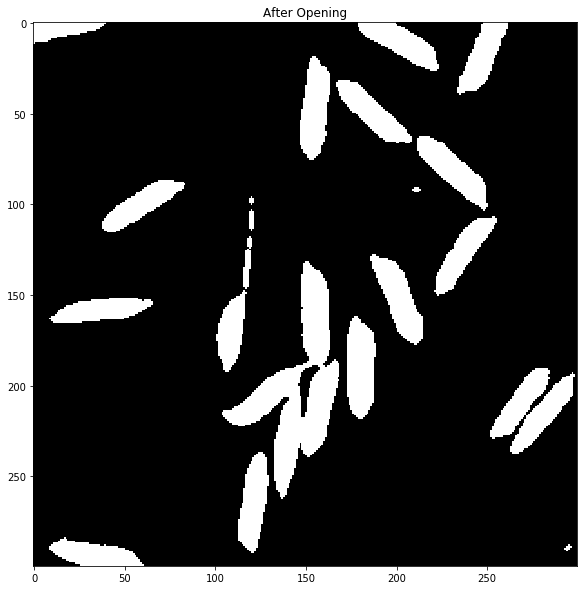

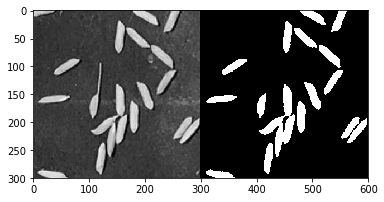

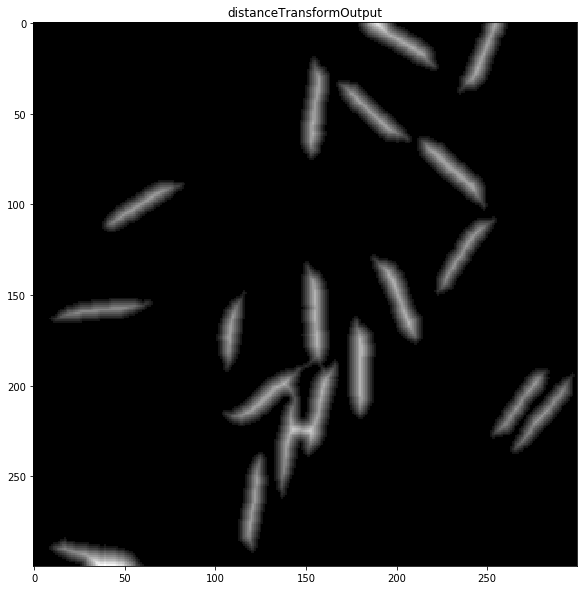

Max Distance: 10.9193


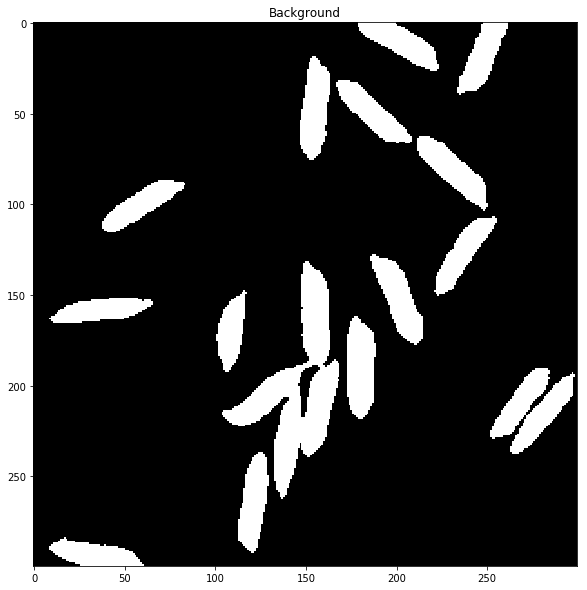

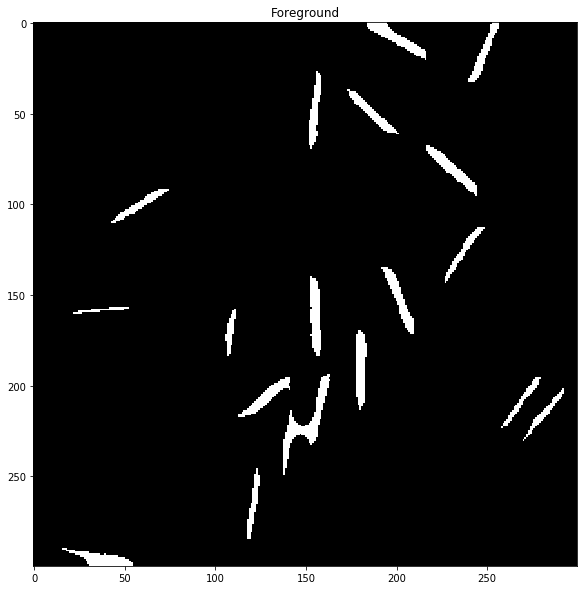

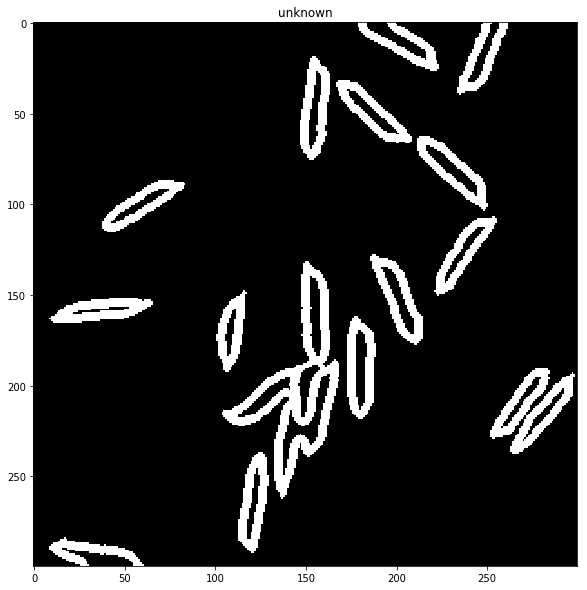

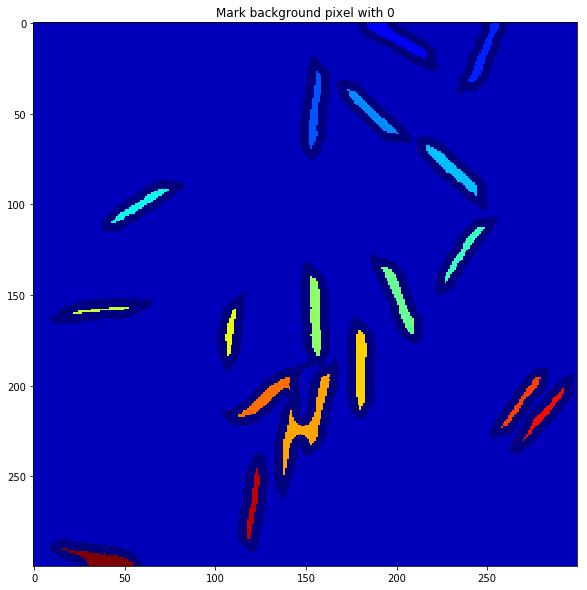

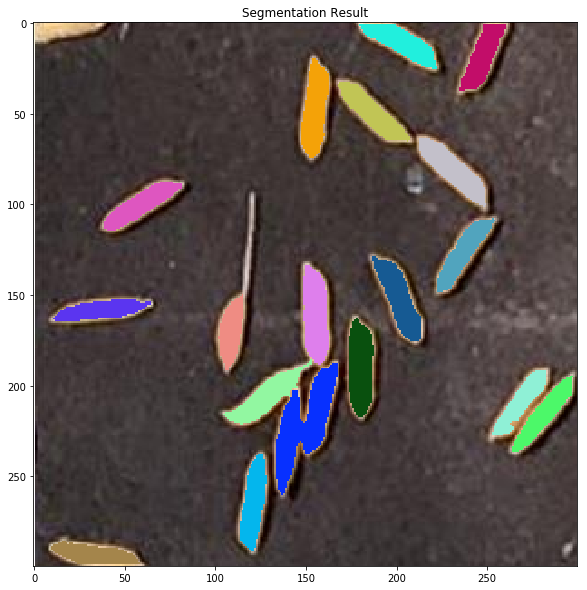

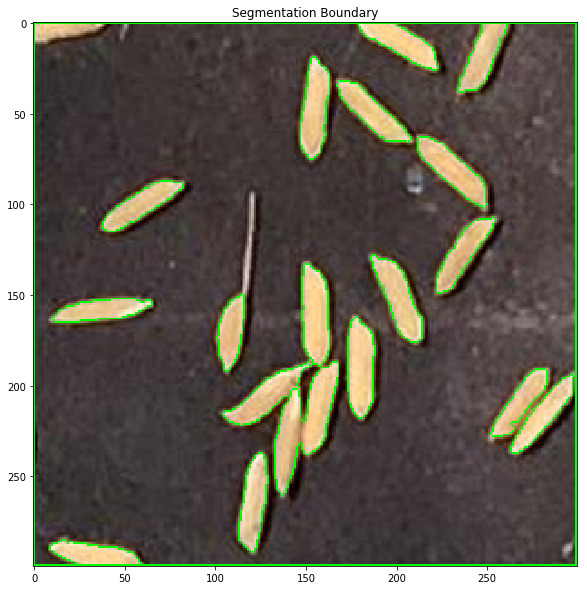

Count: 18
# 1 Area : 475 px | RGB : [246.03578947 208.89052632 155.14736842]
# 2 Area : 443 px | RGB : [227.08577878 192.50790068 149.51467269]
# 3 Area : 556 px | RGB : [235.53417266 198.92446043 152.20143885]
# 4 Area : 488 px | RGB : [231.80327869 200.38729508 144.9057377 ]
# 5 Area : 546 px | RGB : [233.56593407 192.25274725 142.82783883]
# 6 Area : 457 px | RGB : [224.84245077 192.68490153 147.00875274]
# 7 Area : 459 px | RGB : [222.69934641 185.53159041 138.46405229]
# 8 Area : 564 px | RGB : [232.38297872 199.94148936 151.41666667]
# 9 Area : 606 px | RGB : [244.31683168 205.47029703 150.67326733]
# 10 Area : 409 px | RGB : [231.7603912  202.14180929 157.08557457]
# 11 Area : 367 px | RGB : [230.91825613 192.37057221 147.73297003]
# 12 Area : 611 px | RGB : [240.98854337 205.87234043 155.46153846]
# 13 Area : 1050 px | RGB : [230.89619048 192.91904762 145.48285714]
# 14 Area : 528 px | RGB : [227.15151515 189.66287879 146.70643939]
# 15 Area : 397 px | RGB : [234.15365239 194.1

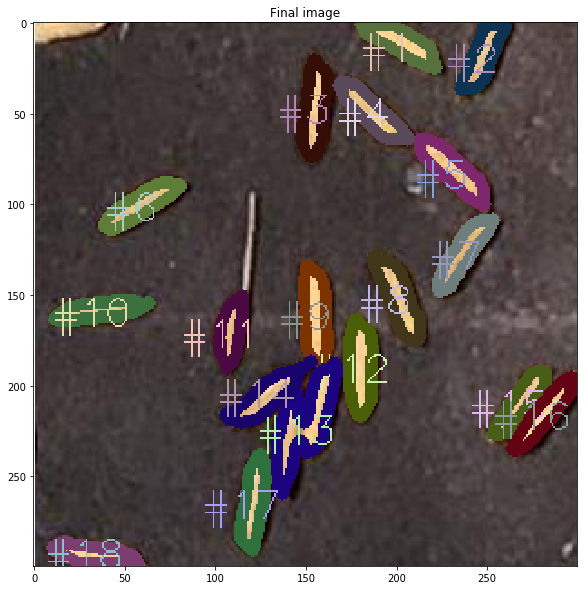

In [20]:
testImplement()

## Avg Color Yellow Rice

AVG Color Bank Note : [189.73540222222223, 183.02296444444445, 179.76227333333333]


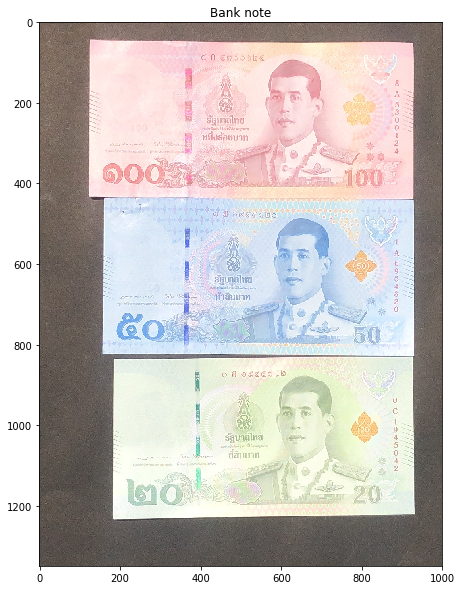

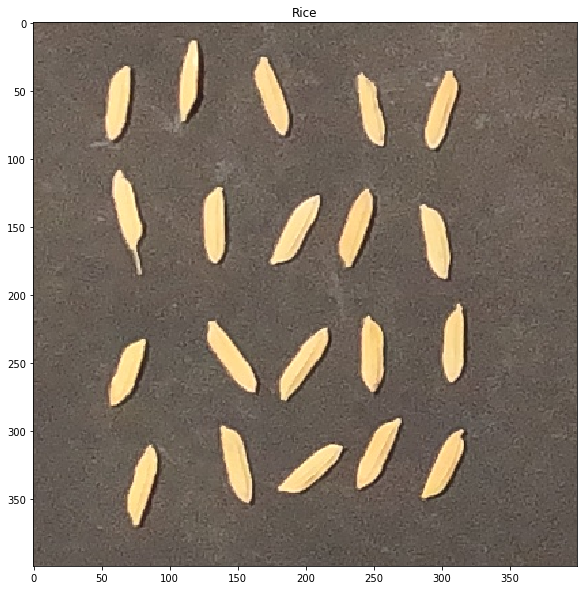

RGBratioAfterCC = [1.         0.91298537 0.8480127 ]


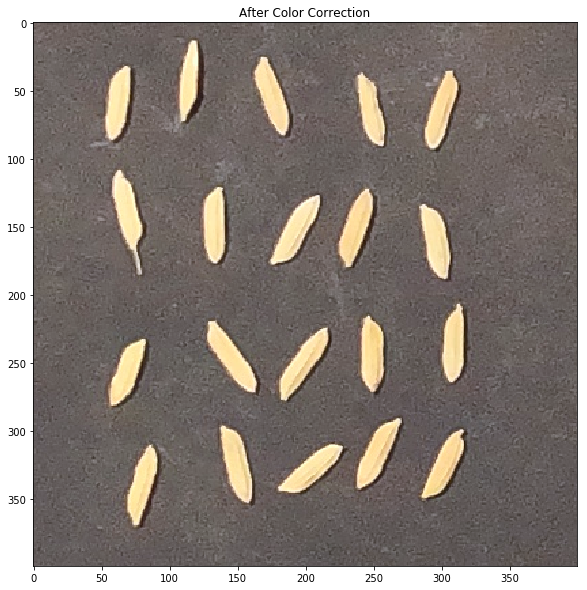

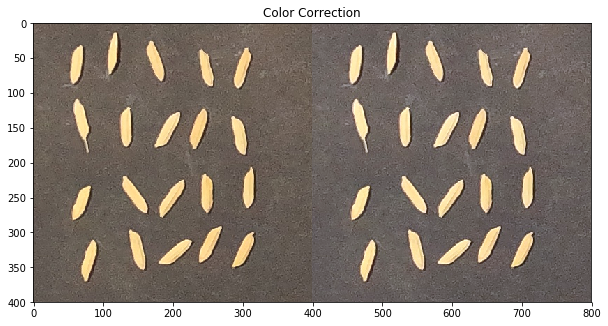

#############################################################################################


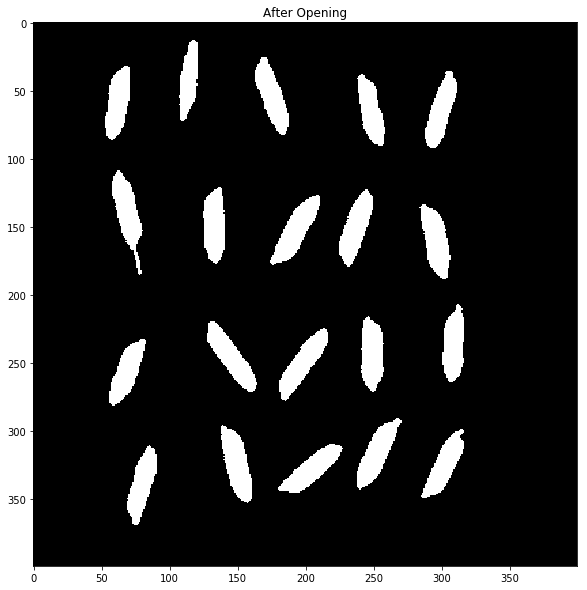

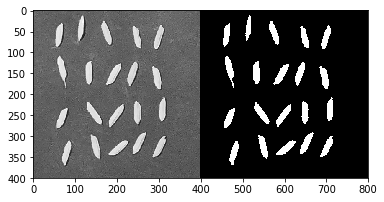

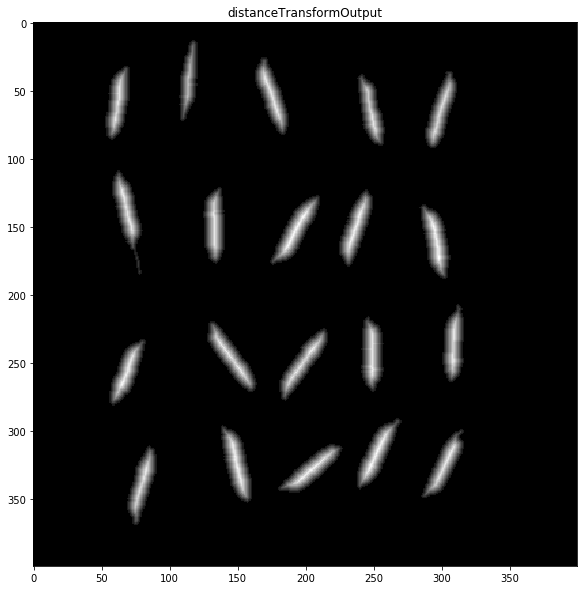

Max Distance: 8.4686


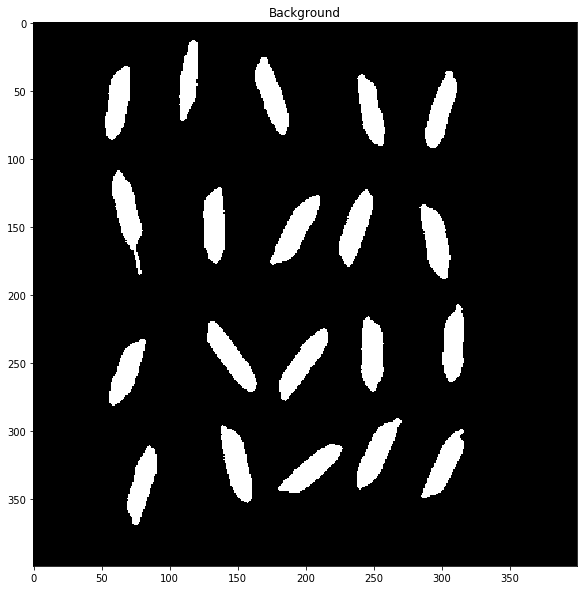

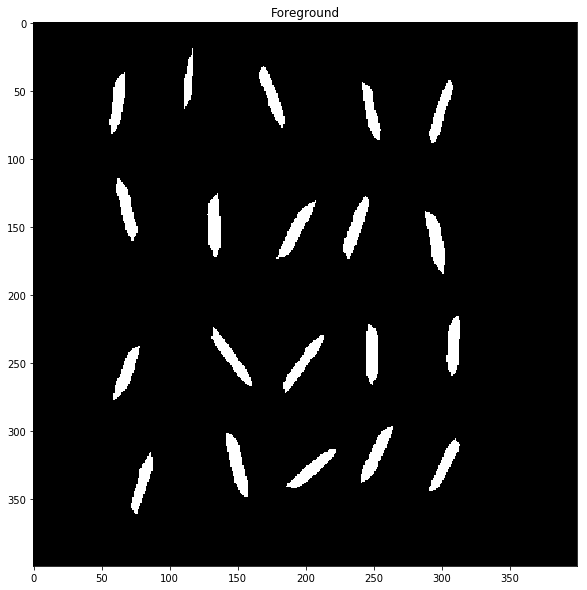

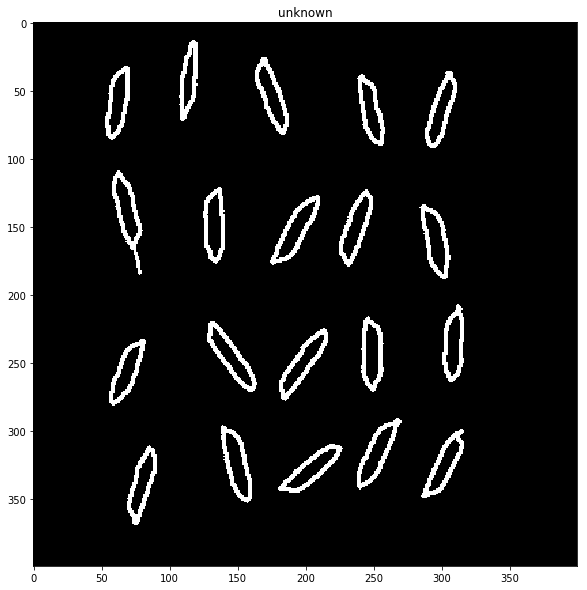

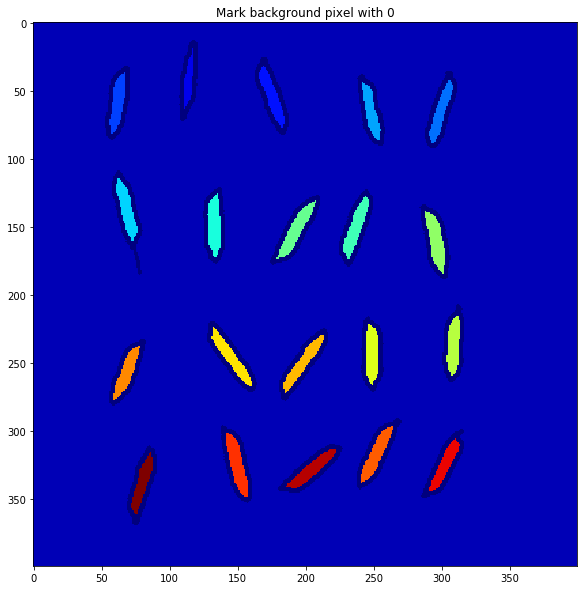

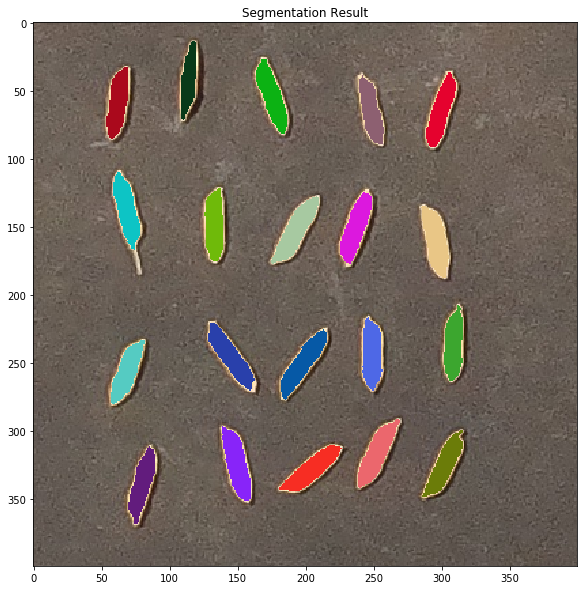

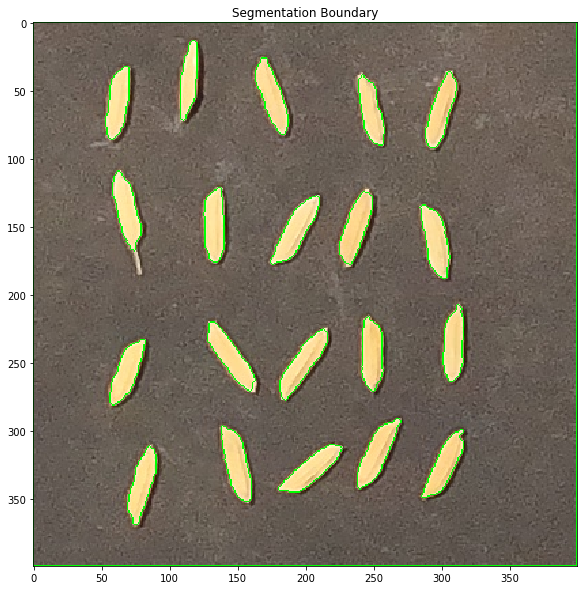

Count: 20
# 1 Area : 439 px | RGB : [254.1571754  231.87927107 169.4214123 ]
# 2 Area : 621 px | RGB : [252.72624799 219.47181965 156.47826087]
# 3 Area : 573 px | RGB : [253.96684119 228.09773124 163.86212914]
# 4 Area : 594 px | RGB : [249.72390572 213.48821549 148.5       ]
# 5 Area : 533 px | RGB : [249.21013133 217.7804878  156.66791745]
# 6 Area : 616 px | RGB : [253.84090909 230.16883117 167.78571429]
# 7 Area : 594 px | RGB : [253.11279461 225.86026936 161.27441077]
# 8 Area : 635 px | RGB : [250.77795276 212.86299213 145.07244094]
# 9 Area : 680 px | RGB : [250.88676471 224.74411765 166.07794118]
# 10 Area : 640 px | RGB : [249.796875 221.871875 160.678125]
# 11 Area : 578 px | RGB : [250.83910035 219.69031142 156.04844291]
# 12 Area : 592 px | RGB : [249.31081081 213.22466216 142.16385135]
# 13 Area : 643 px | RGB : [254.35614308 222.9222395  156.8911353 ]
# 14 Area : 655 px | RGB : [249.60458015 218.78778626 154.9389313 ]
# 15 Area : 567 px | RGB : [254.13932981 226.90828924

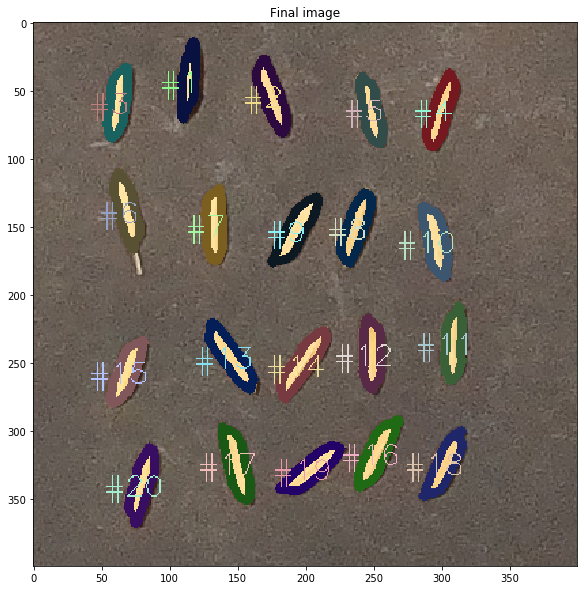

Avg Color Yellow Rice = [251.48000617 220.92391788 155.87751652]


In [21]:
img = cv2.imread(filePath('07.03.62')[8])
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
rice_img = img.copy()[1600:2000,950:1350]
bank_note = img.copy()[900:2250,1500:2500]
# img = cv2.imread(filePath('29.03.62')[0])
# img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
# rice_img = img.copy()[1500:2500,0:1200]
# bank_note = img.copy()[250:2800,2250:]

avg_bank_note = avgColor(bank_note)
print('AVG Color Bank Note :',avg_bank_note)
plt.figure(figsize=(10,10))
plt.title('Bank note')
plt.imshow(bank_note)
plt.show()

plt.figure(figsize=(10,10))
plt.title('Rice')
plt.imshow(rice_img)
plt.show()

imgCC = colorCorrection(rice_img,avg_bank_note)
plt.figure(figsize=(10,10))
plt.title('Color Correction')
plt.imshow(np.hstack((rice_img,imgCC)))
plt.show()
print('#############################################################################################')
imgCC = cv2.cvtColor(imgCC,cv2.COLOR_RGB2BGR)
rice_img = cv2.cvtColor(rice_img,cv2.COLOR_RGB2BGR)
avg_color = plotConnectedComponents(rice_img)
print('Avg Color Yellow Rice =', np.mean(avg_color,axis=0))
yellow_rice = [np.mean(avg_color,axis=0), avg_color]

## Avg Color Lemon-Green Rice

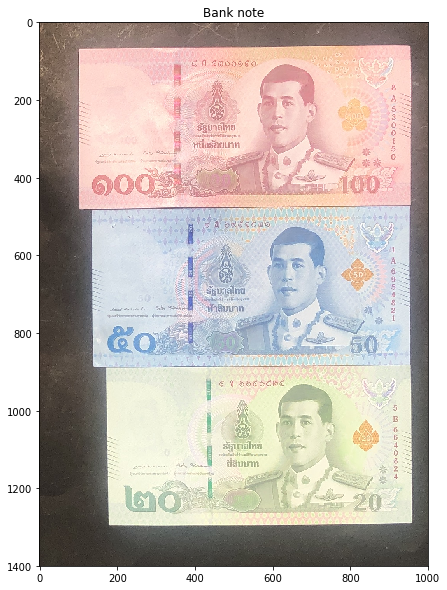

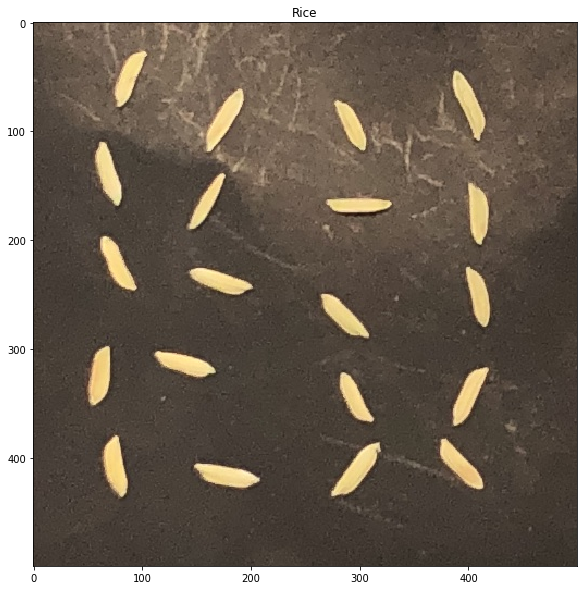

RGBratioAfterCC = [1.         0.90725963 0.82320611]


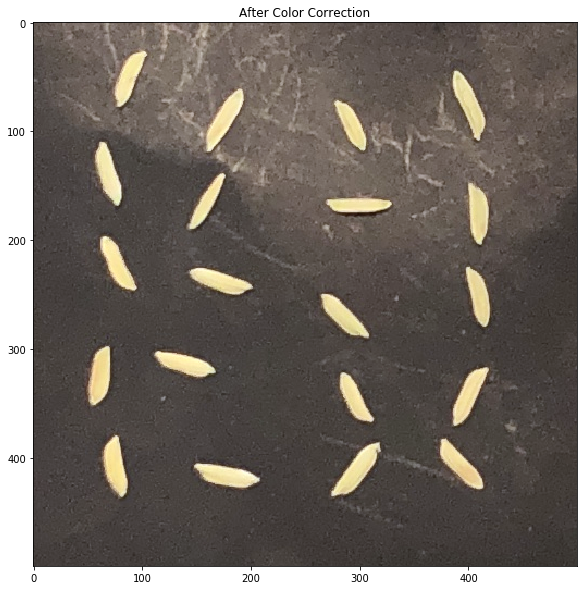

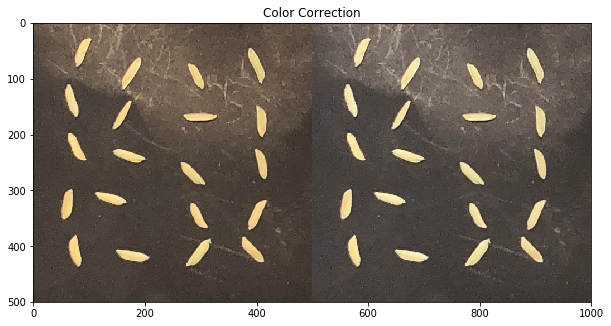

#############################################################################################


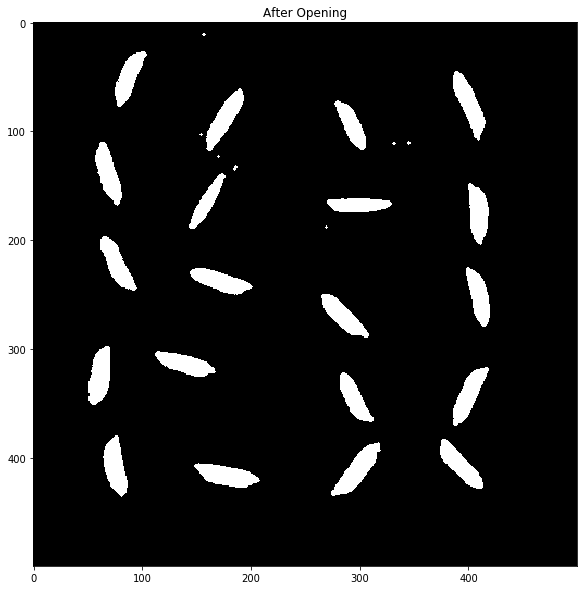

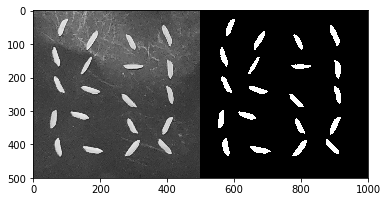

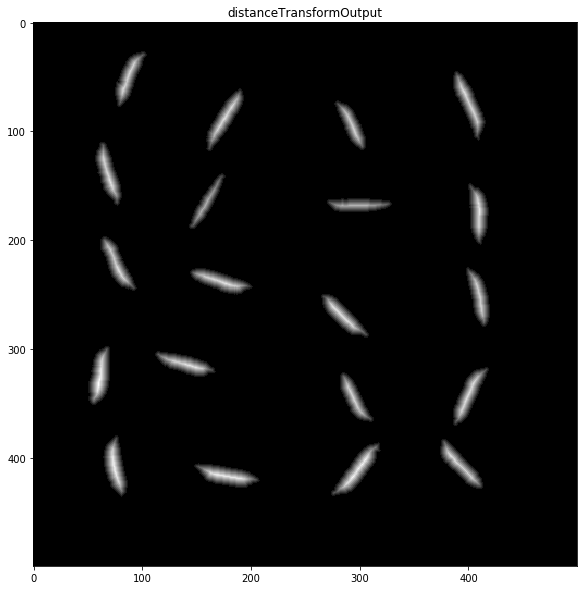

Max Distance: 9.55


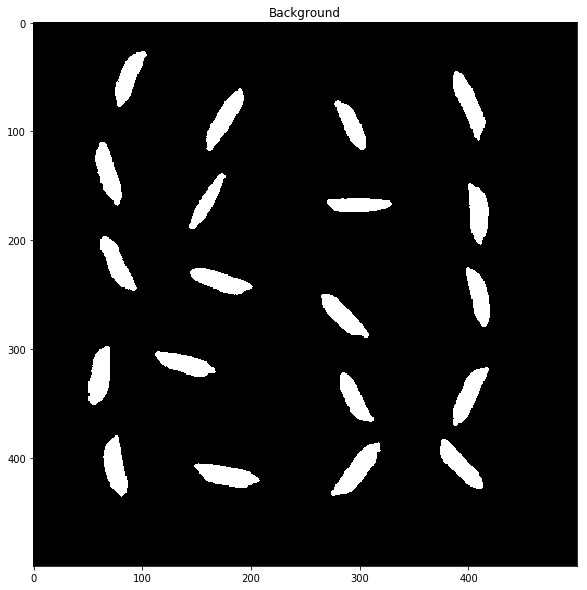

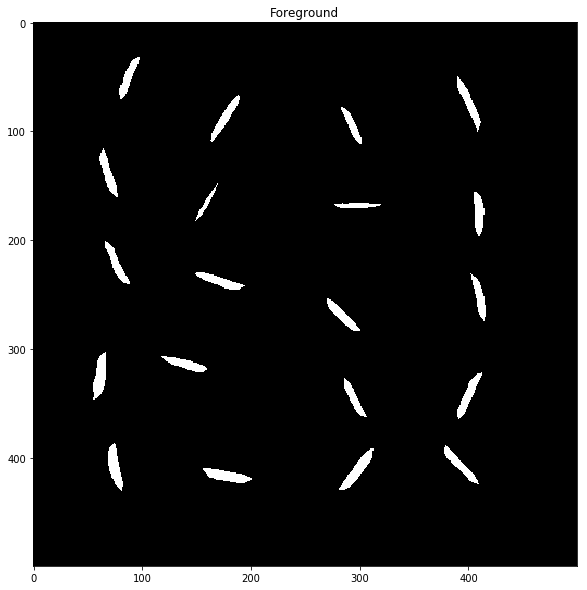

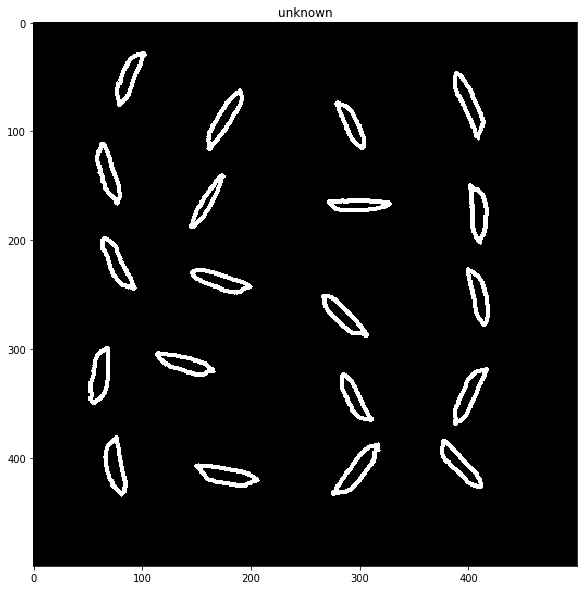

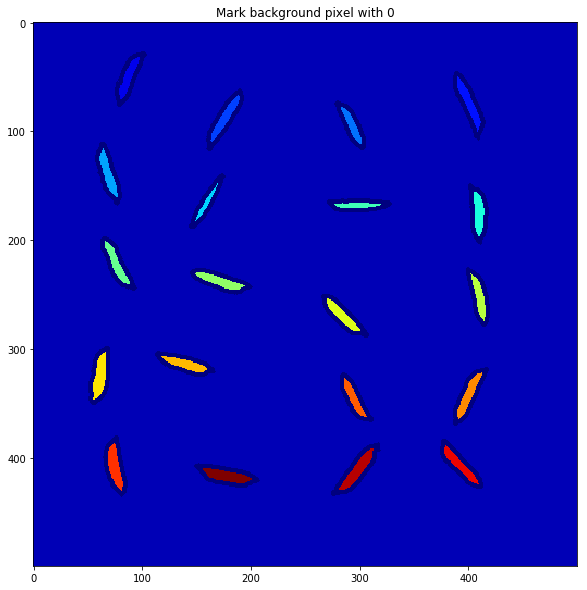

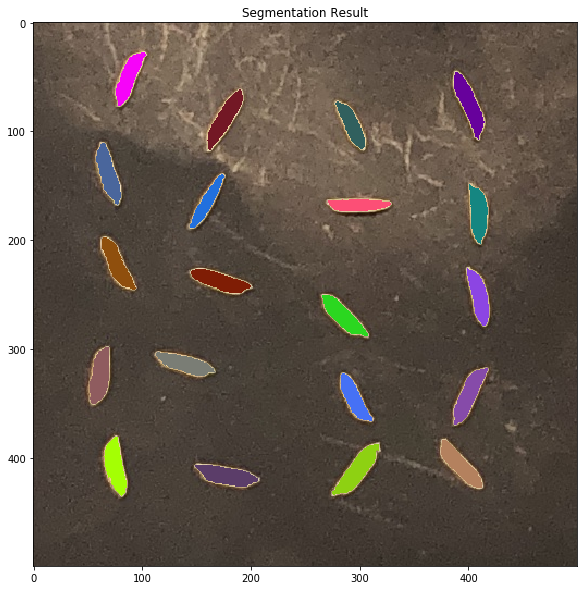

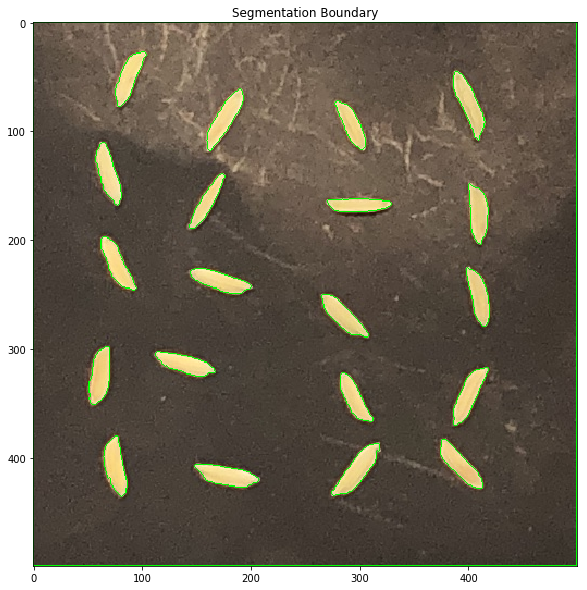

Count: 20
# 1 Area : 607 px | RGB : [246.85667216 220.77265239 151.1416804 ]
# 2 Area : 725 px | RGB : [231.67172414 207.73517241 142.59448276]
# 3 Area : 695 px | RGB : [246.69928058 219.25035971 153.44892086]
# 4 Area : 523 px | RGB : [239.26959847 212.65391969 141.21988528]
# 5 Area : 661 px | RGB : [242.35552194 219.67927383 158.33282905]
# 6 Area : 468 px | RGB : [242.86538462 216.82478632 150.78632479]
# 7 Area : 626 px | RGB : [232.49041534 206.65015974 138.39456869]
# 8 Area : 507 px | RGB : [242.41420118 216.42998028 148.35897436]
# 9 Area : 631 px | RGB : [246.88431062 217.91917591 145.79397781]
# 10 Area : 655 px | RGB : [241.24732824 215.27022901 148.72366412]
# 11 Area : 598 px | RGB : [232.26755853 204.33277592 138.74414716]
# 12 Area : 648 px | RGB : [233.12191358 209.20679012 142.19290123]
# 13 Area : 685 px | RGB : [240.72262774 207.03211679 135.08467153]
# 14 Area : 628 px | RGB : [247.07961783 220.19904459 153.01592357]
# 15 Area : 685 px | RGB : [242.09489051 210.79

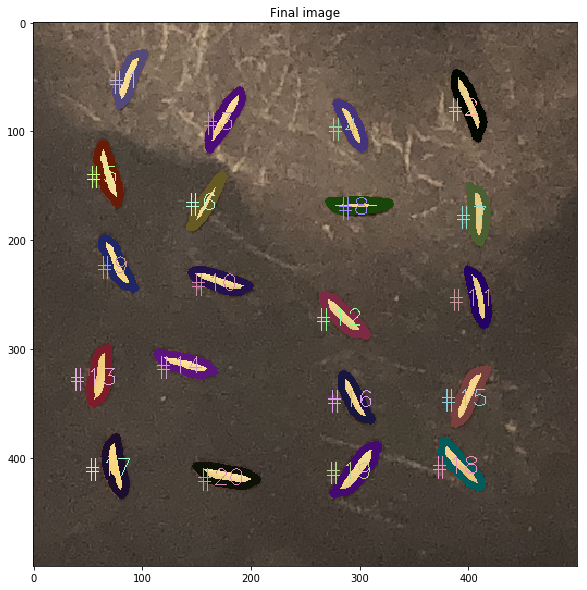

Avg Color Lemon-Green Rice = [240.68575112 213.29779227 145.80434947]


In [22]:
img = cv2.imread(filePath('17.03.62')[2])
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
rice_img = img.copy()[1250:1750,1600:2100]
bank_note = img[750:2150,2250:3250]

# c = 0
# for i in filePath('17.03.62'):
#     print(c,i[16:])
#     c += 1
avg_bank_note = avgColor(bank_note)
plt.figure(figsize=(10,10))
plt.title('Bank note')
plt.imshow(bank_note)
plt.show()

plt.figure(figsize=(10,10))
plt.title('Rice')
plt.imshow(rice_img)
plt.show()

imgCC = colorCorrection(rice_img,avg_bank_note)
plt.figure(figsize=(10,10))
plt.title('Color Correction')
plt.imshow(np.hstack((rice_img,imgCC)))
plt.show()
print('#############################################################################################')
imgCC = cv2.cvtColor(imgCC,cv2.COLOR_RGB2BGR)
rice_img = cv2.cvtColor(rice_img,cv2.COLOR_RGB2BGR)
avg_color = plotConnectedComponents(rice_img)
print('Avg Color Lemon-Green Rice =', np.mean(avg_color,axis=0))
lemon_green_rice = [np.mean(avg_color,axis=0), avg_color]

## Avg Color Green Rice

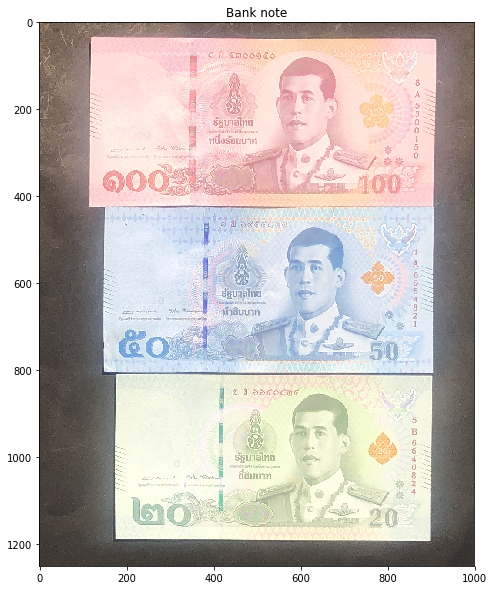

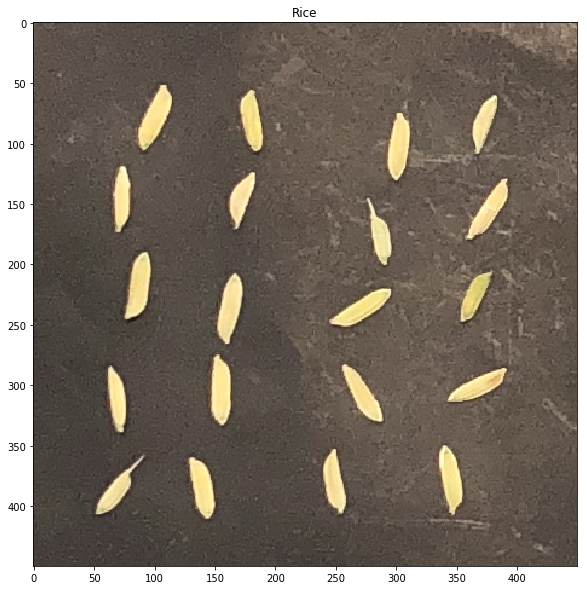

RGBratioAfterCC = [1.         0.92415783 0.8590247 ]


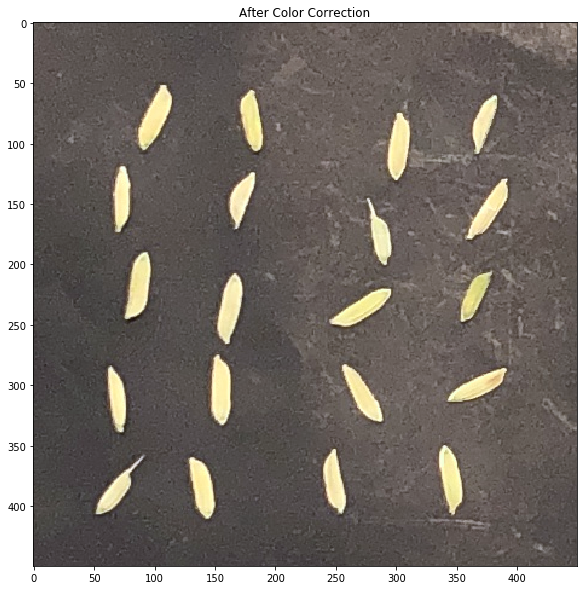

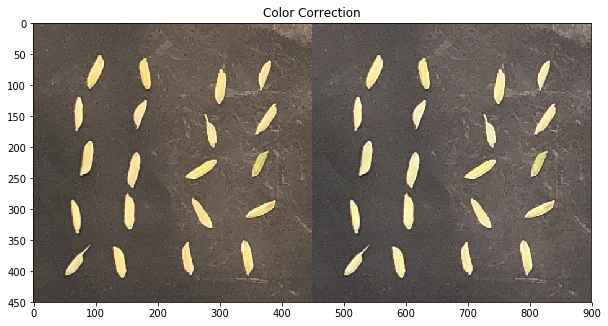

#############################################################################################


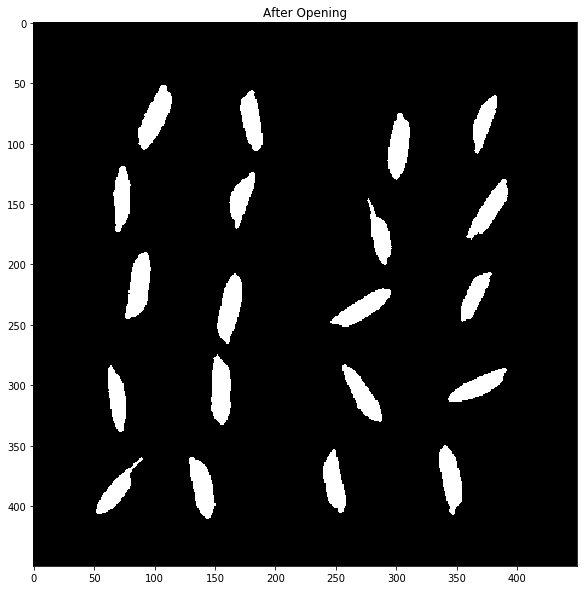

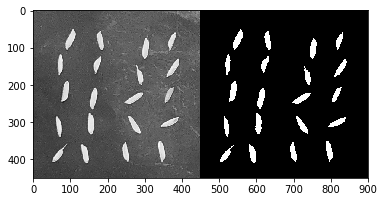

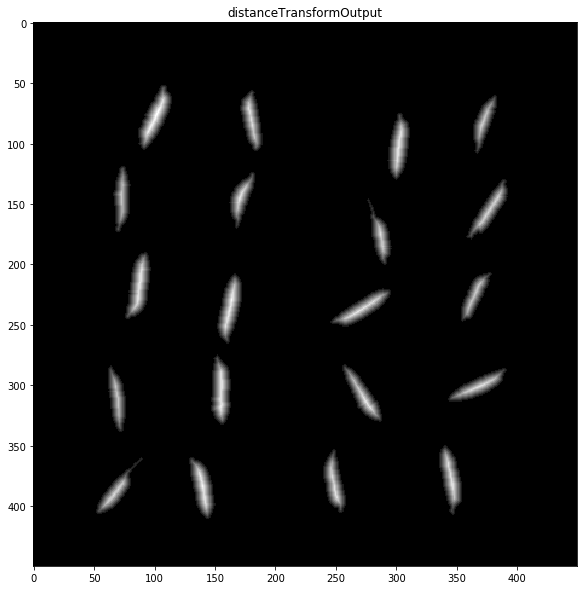

Max Distance: 8.7565


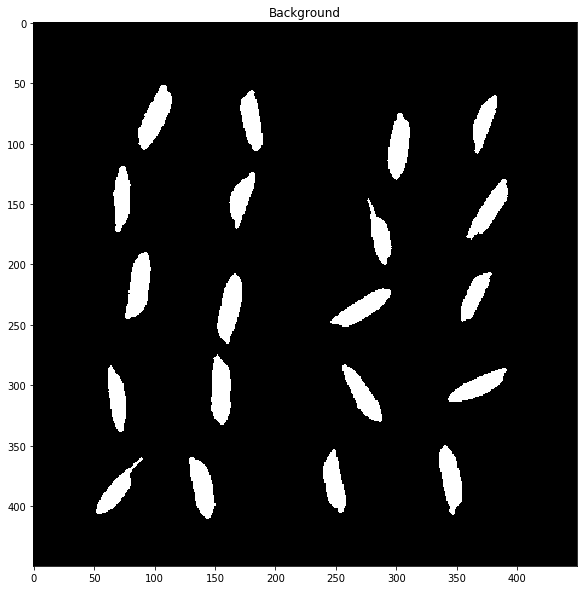

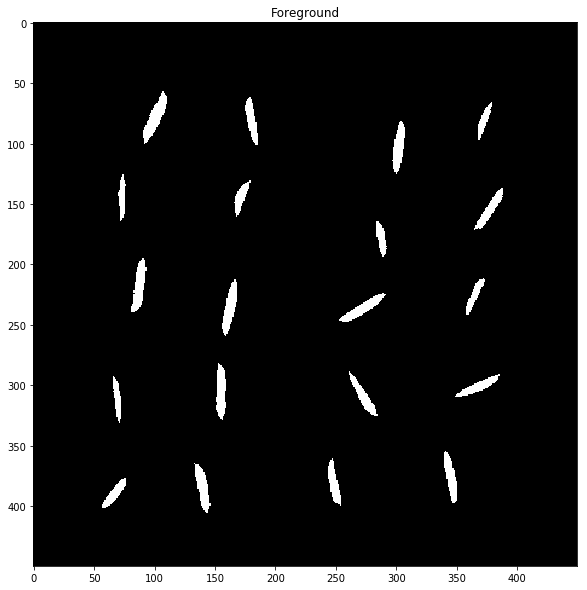

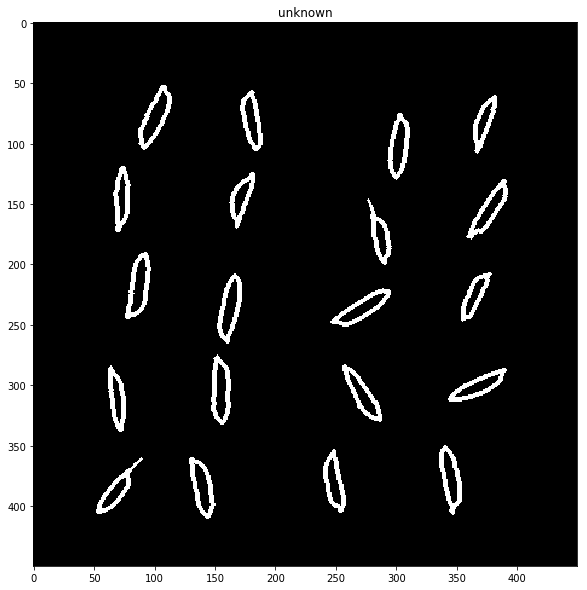

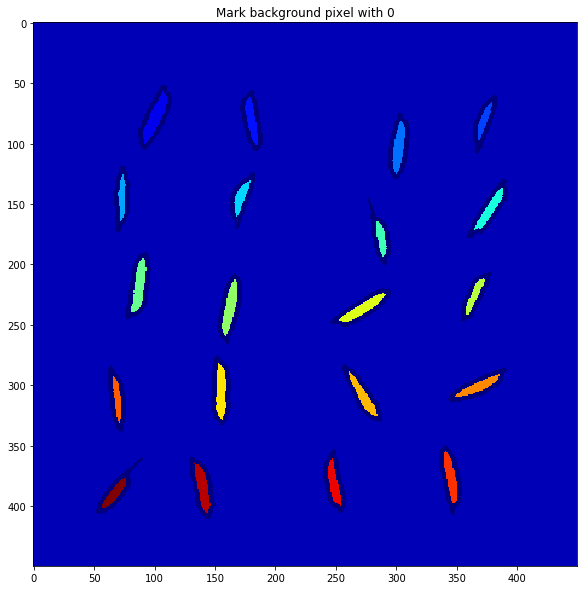

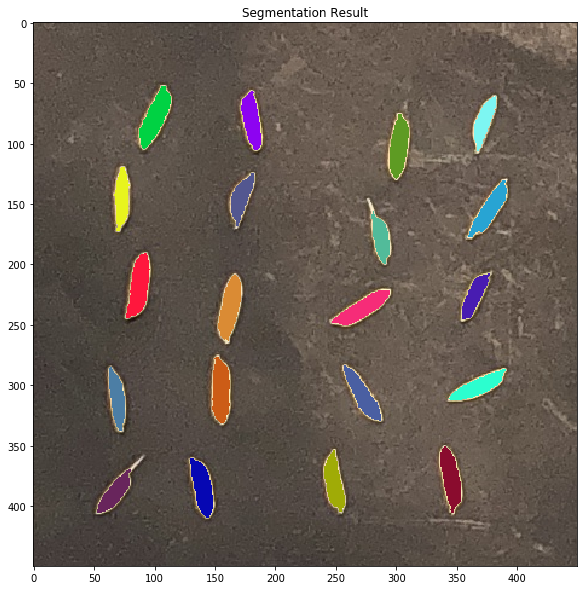

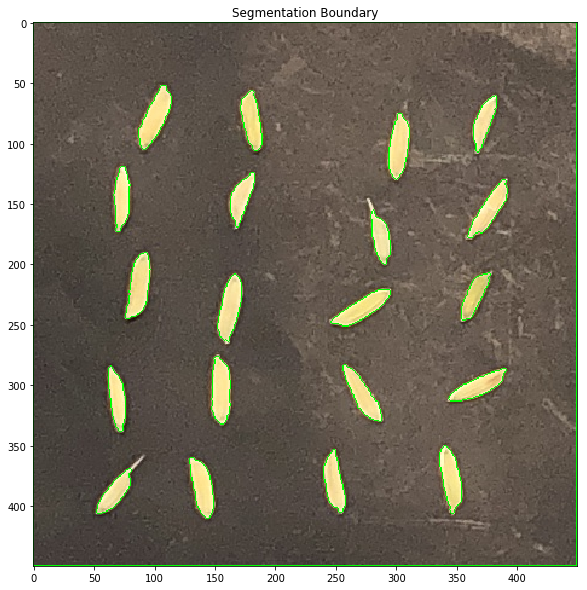

Count: 20
# 1 Area : 660 px | RGB : [250.5969697  227.43333333 153.37575758]
# 2 Area : 515 px | RGB : [244.70679612 224.20582524 142.27572816]
# 3 Area : 406 px | RGB : [247.02216749 227.88423645 167.81773399]
# 4 Area : 590 px | RGB : [250.10169492 227.7220339  157.02881356]
# 5 Area : 443 px | RGB : [252.28893905 233.44469526 168.04063205]
# 6 Area : 425 px | RGB : [250.60470588 230.12470588 173.21882353]
# 7 Area : 545 px | RGB : [249.28256881 226.08073394 161.93944954]
# 8 Area : 391 px | RGB : [241.94373402 229.16112532 170.46547315]
# 9 Area : 646 px | RGB : [244.68266254 224.69349845 154.86532508]
# 10 Area : 636 px | RGB : [246.51415094 226.29402516 163.95283019]
# 11 Area : 407 px | RGB : [222.01719902 206.86732187 124.43980344]
# 12 Area : 580 px | RGB : [245.2        228.14482759 147.87068966]
# 13 Area : 625 px | RGB : [251.992  231.8272 162.2512]
# 14 Area : 544 px | RGB : [249.62683824 227.33272059 158.82904412]
# 15 Area : 510 px | RGB : [243.31960784 220.48039216 150.9

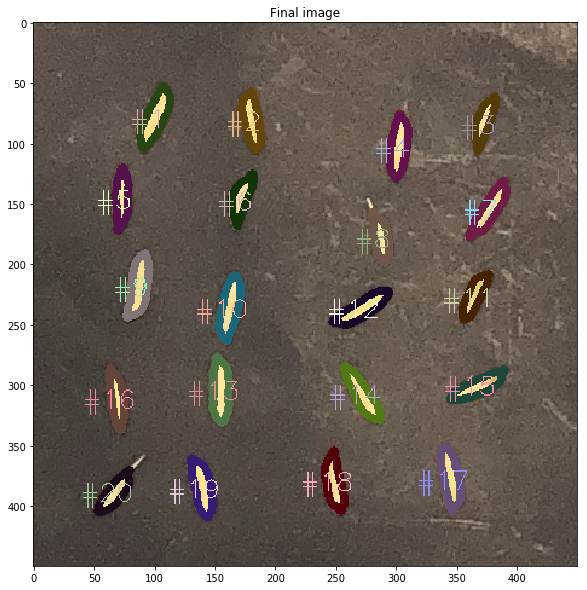

Avg Color Green Rice = [246.36884818 226.67700139 158.14571368]


In [23]:
img = cv2.imread(filePath('17.03.62')[0])
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
rice_img = img.copy()[1200:1650,1350:1800]
bank_note = img[650:1900,2250:3250]

avg_bank_note = avgColor(bank_note)
plt.figure(figsize=(10,10))
plt.title('Bank note')
plt.imshow(bank_note)
plt.show()

plt.figure(figsize=(10,10))
plt.title('Rice')
plt.imshow(rice_img)
plt.show()

imgCC = colorCorrection(rice_img,avg_bank_note)
plt.figure(figsize=(10,10))
plt.title('Color Correction')
plt.imshow(np.hstack((rice_img,imgCC)))
plt.show()
print('#############################################################################################')
imgCC = cv2.cvtColor(imgCC,cv2.COLOR_RGB2BGR)
rice_img = cv2.cvtColor(rice_img,cv2.COLOR_RGB2BGR)
avg_color = plotConnectedComponents(rice_img)
print('Avg Color Green Rice =', np.mean(avg_color,axis=0))
green_rice = [np.mean(avg_color,axis=0), avg_color]

## Avg Color Red Rice

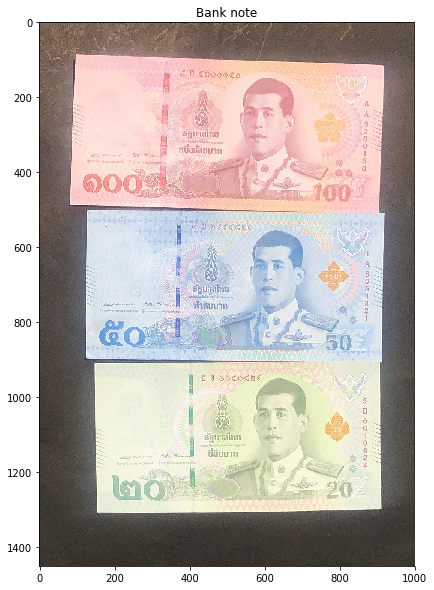

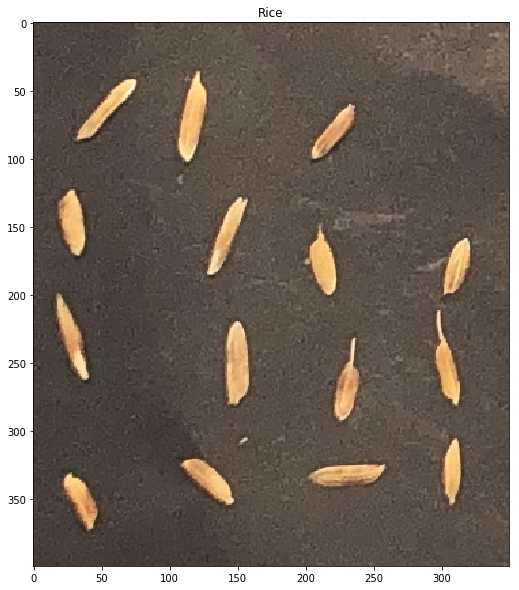

RGBratioAfterCC = [1.         0.90239581 0.83818698]


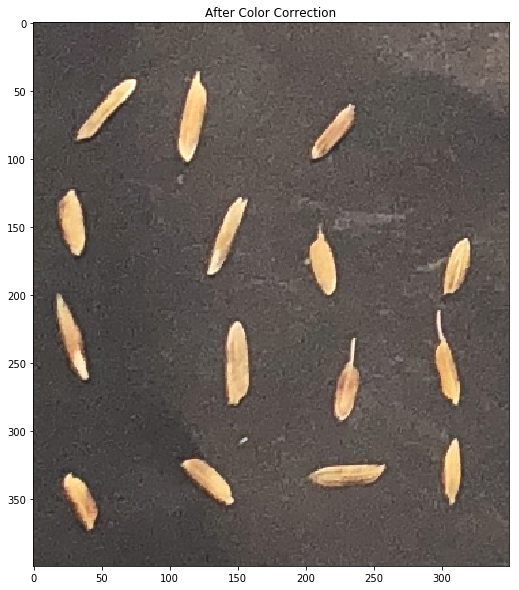

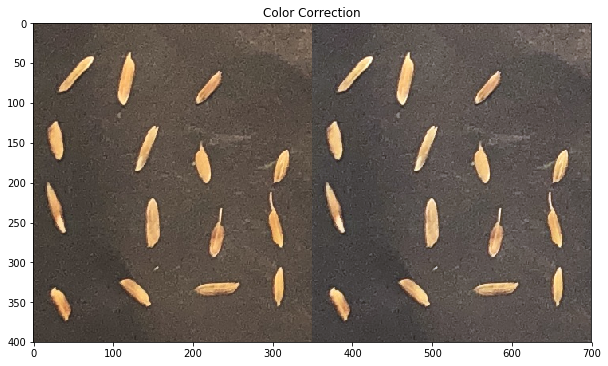

#############################################################################################


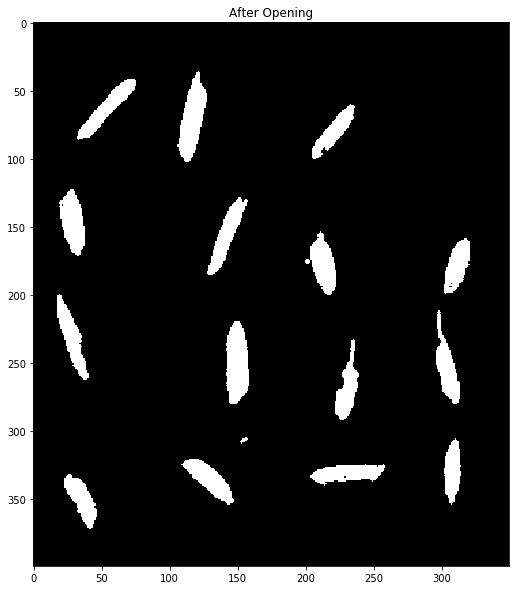

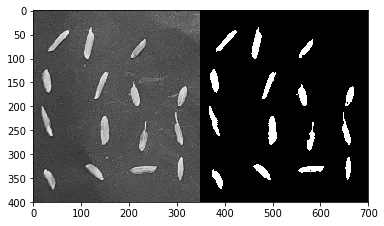

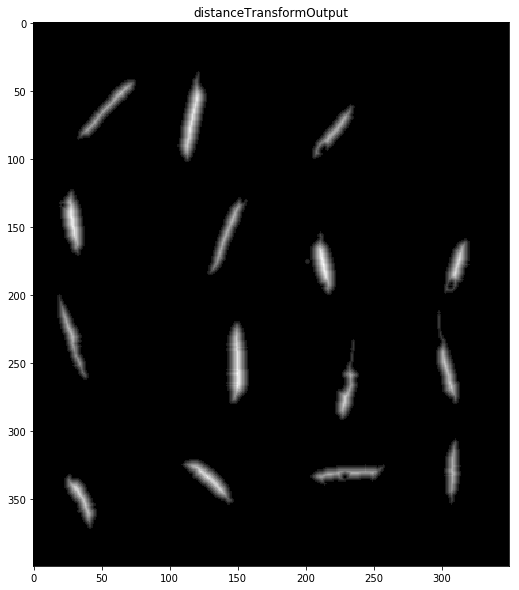

Max Distance: 8.4686


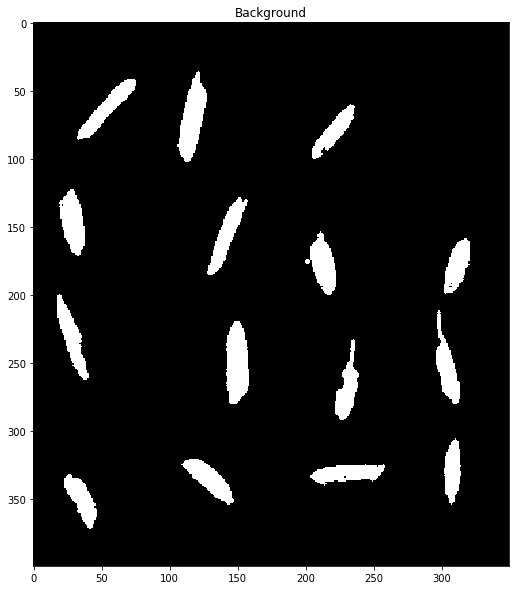

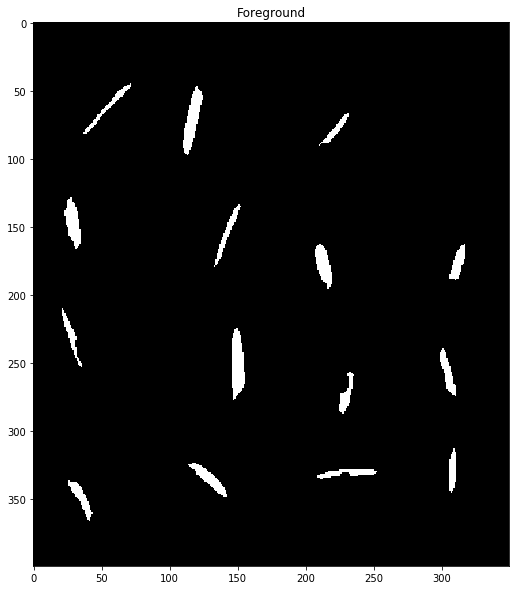

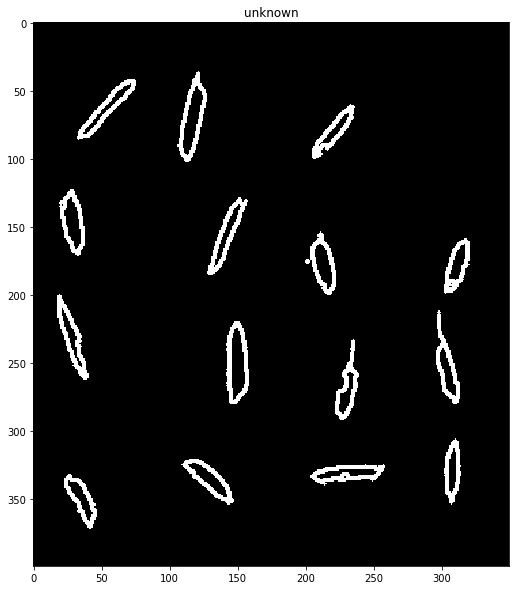

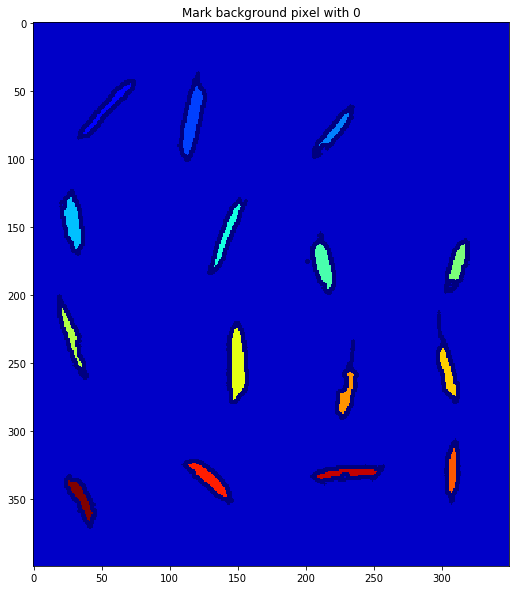

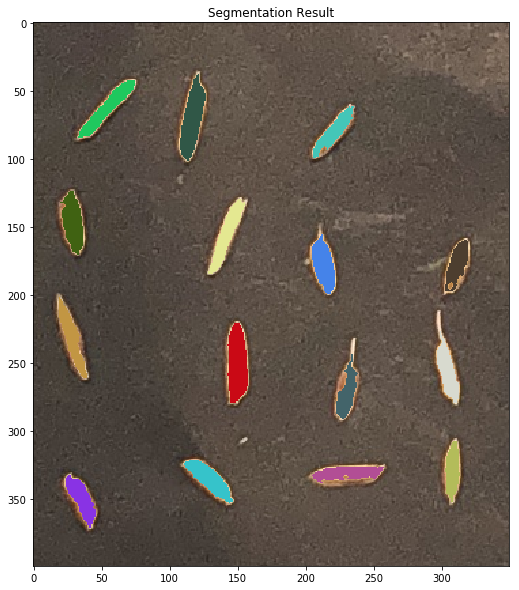

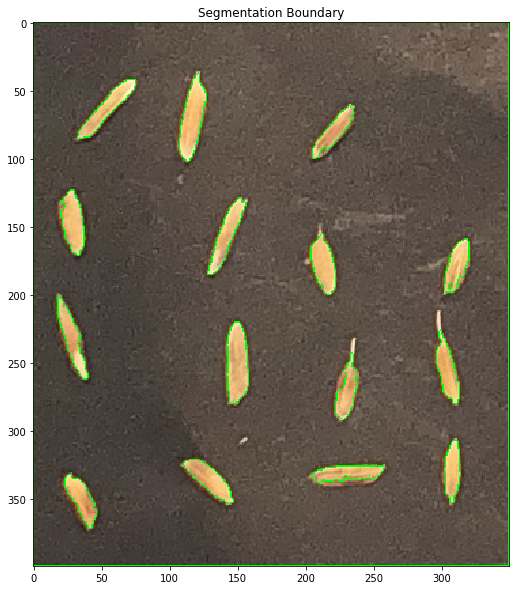

Count: 15
# 1 Area : 467 px | RGB : [239.74732334 198.62955032 135.5888651 ]
# 2 Area : 658 px | RGB : [246.25531915 196.96352584 129.19148936]
# 3 Area : 365 px | RGB : [225.9369863  172.19452055 121.11506849]
# 4 Area : 503 px | RGB : [239.34592445 190.73359841 125.34393638]
# 5 Area : 473 px | RGB : [234.79915433 195.4038055  138.11839323]
# 6 Area : 474 px | RGB : [242.96202532 192.76160338 124.39029536]
# 7 Area : 364 px | RGB : [240.13461538 195.30769231 129.01373626]
# 8 Area : 426 px | RGB : [231.90375587 184.57276995 129.87323944]
# 9 Area : 672 px | RGB : [232.61755952 185.33482143 128.29017857]
# 10 Area : 417 px | RGB : [237.19184652 183.34292566 113.99040767]
# 11 Area : 352 px | RGB : [230.5625     176.91761364 121.68181818]
# 12 Area : 330 px | RGB : [242.87878788 197.16363636 127.02121212]
# 13 Area : 462 px | RGB : [232.02380952 181.67099567 119.61038961]
# 14 Area : 408 px | RGB : [226.38480392 179.25735294 118.88970588]
# 15 Area : 393 px | RGB : [231.66666667 174.97

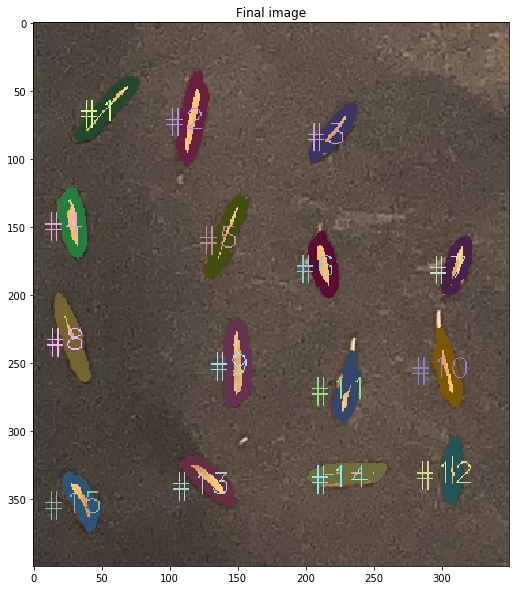

Avg Color Red Rice = [235.62740521 187.01509481 124.84744073]


In [24]:
img = cv2.imread(filePath('17.03.62')[7])
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
rice_img = img.copy()[1400:1800,1500:1850]
bank_note = img[850:2300,2250:3250]

avg_bank_note = avgColor(bank_note)
plt.figure(figsize=(10,10))
plt.title('Bank note')
plt.imshow(bank_note)
plt.show()

plt.figure(figsize=(10,10))
plt.title('Rice')
plt.imshow(rice_img)
plt.show()

imgCC = colorCorrection(rice_img,avg_bank_note)
plt.figure(figsize=(10,10))
plt.title('Color Correction')
plt.imshow(np.hstack((rice_img,imgCC)))
plt.show()
print('#############################################################################################')
imgCC = cv2.cvtColor(imgCC,cv2.COLOR_RGB2BGR)
rice_img = cv2.cvtColor(rice_img,cv2.COLOR_RGB2BGR)
avg_color = plotConnectedComponents(rice_img)
print('Avg Color Red Rice =', np.mean(avg_color,axis=0))
red_rice = [np.mean(avg_color,axis=0), avg_color]

In [16]:
print(yellow_rice)
print(lemon_green_rice)
print(green_rice)
print(red_rice)

[array([251.48000617, 220.92391788, 155.87751652]), array([[254.1571754 , 231.87927107, 169.4214123 ],
       [252.72624799, 219.47181965, 156.47826087],
       [253.96684119, 228.09773124, 163.86212914],
       [249.72390572, 213.48821549, 148.5       ],
       [249.21013133, 217.7804878 , 156.66791745],
       [253.84090909, 230.16883117, 167.78571429],
       [253.11279461, 225.86026936, 161.27441077],
       [250.77795276, 212.86299213, 145.07244094],
       [250.88676471, 224.74411765, 166.07794118],
       [249.796875  , 221.871875  , 160.678125  ],
       [250.83910035, 219.69031142, 156.04844291],
       [249.31081081, 213.22466216, 142.16385135],
       [254.35614308, 222.9222395 , 156.8911353 ],
       [249.60458015, 218.78778626, 154.9389313 ],
       [254.13932981, 226.90828924, 155.65608466],
       [250.41846154, 215.16307692, 149.08      ],
       [249.31381381, 217.51801802, 152.21471471],
       [249.90410959, 212.6010274 , 143.28938356],
       [250.1825525 , 221.5928

In [25]:
print(yellow_rice)
print(lemon_green_rice)
print(green_rice)
print(red_rice)

[array([251.48000617, 220.92391788, 155.87751652]), array([[254.1571754 , 231.87927107, 169.4214123 ],
       [252.72624799, 219.47181965, 156.47826087],
       [253.96684119, 228.09773124, 163.86212914],
       [249.72390572, 213.48821549, 148.5       ],
       [249.21013133, 217.7804878 , 156.66791745],
       [253.84090909, 230.16883117, 167.78571429],
       [253.11279461, 225.86026936, 161.27441077],
       [250.77795276, 212.86299213, 145.07244094],
       [250.88676471, 224.74411765, 166.07794118],
       [249.796875  , 221.871875  , 160.678125  ],
       [250.83910035, 219.69031142, 156.04844291],
       [249.31081081, 213.22466216, 142.16385135],
       [254.35614308, 222.9222395 , 156.8911353 ],
       [249.60458015, 218.78778626, 154.9389313 ],
       [254.13932981, 226.90828924, 155.65608466],
       [250.41846154, 215.16307692, 149.08      ],
       [249.31381381, 217.51801802, 152.21471471],
       [249.90410959, 212.6010274 , 143.28938356],
       [250.1825525 , 221.5928

[1.         0.87849496 0.61984059] [0.40026649 0.35163209 0.24810142]
[1.         0.88620864 0.60578721] [0.40128478 0.35562204 0.24309319]
[1.         0.92007169 0.64190629] [0.39032342 0.35912552 0.25055106]
[1.         0.79368991 0.5298511 ] [0.4303776  0.34158636 0.22803604]


Text(0,0.5,'Blue/Red Ratio')

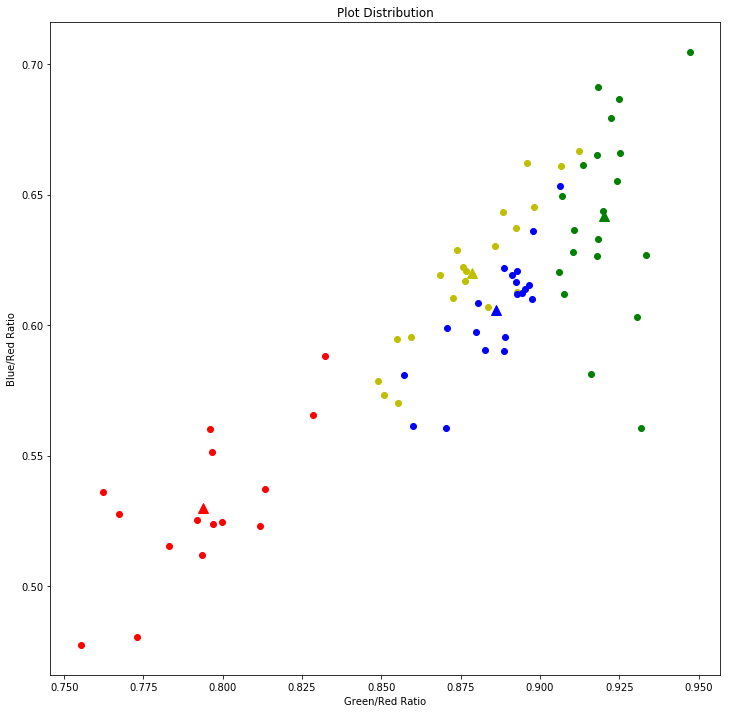

In [26]:
yellow = yellow_rice[0]
lemon_green = lemon_green_rice[0]
green = green_rice[0]
red = red_rice[0]

print(yellow/yellow[0],yellow/np.sum(yellow))
print(lemon_green/lemon_green[0],lemon_green/np.sum(lemon_green))
print(green/green[0],green/np.sum(green))
print(red/red[0],red/np.sum(red))

yellow = yellow/yellow[0]
lemon_green = lemon_green/lemon_green[0]
green = green/green[0]
red = red/red[0]
plt.figure(figsize=(12, 12))  
plt.plot(yellow[1], yellow[2], 'y^', lemon_green[1], lemon_green[2], 'b^',
         green[1] , green[2], 'g^', red[1], red[2], 'r^', markersize=10)

yellow = yellow_rice[1]
yellowX = np.array(yellow)[:,1]/np.array(yellow)[:,0]
yellowY = np.array(yellow)[:,2]/np.array(yellow)[:,0]

lemon_green = lemon_green_rice[1]
lemon_greenX = np.array(lemon_green)[:,1]/np.array(lemon_green)[:,0]
lemon_greenY = np.array(lemon_green)[:,2]/np.array(lemon_green)[:,0]

green = green_rice[1]
greenX = np.array(green)[:,1]/np.array(green)[:,0]
greenY = np.array(green)[:,2]/np.array(green)[:,0]

red = red_rice[1]
redX = np.array(red)[:,1]/np.array(red)[:,0]
redY = np.array(red)[:,2]/np.array(red)[:,0]

plt.plot(yellowX, yellowY, 'yo',lemon_greenX, lemon_greenY, 'bo', greenX, greenY, 'go', redX, redY, 'ro')
plt.title('Plot Distribution')  
plt.xlabel('Green/Red Ratio') 
plt.ylabel('Blue/Red Ratio')

6 876900.5


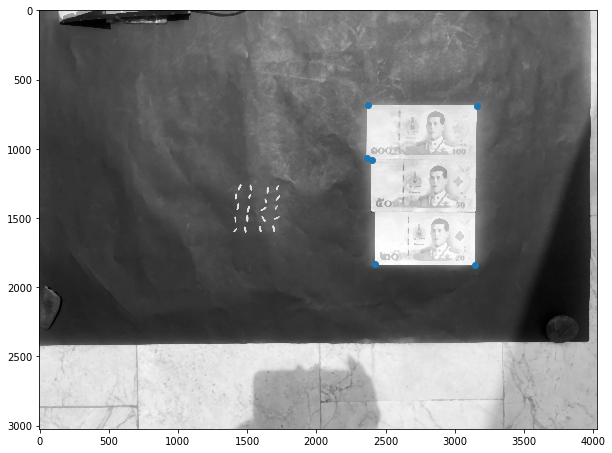

Found Bank Note


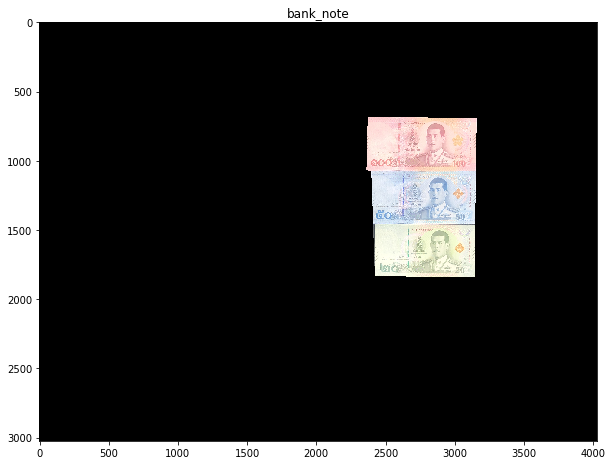

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]


In [15]:
def cropBankNote(img):
    bank_note = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    bank_note = cv2.medianBlur(bank_note,13)
    threshold = cv2.threshold(bank_note,0,255,cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]

    kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(3,3))
    threshold = cv2.morphologyEx(threshold, cv2.MORPH_CLOSE, kernel, iterations = 1)
    threshold = cv2.morphologyEx(threshold, cv2.MORPH_OPEN, kernel, iterations = 1)

    contours = cv2.findContours(threshold, cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)[-2]

    font = cv2.FONT_HERSHEY_COMPLEX
    bank_size = 876900.5
    isFoundBank = False
    bank_notes = []
    for cnt in contours:
        approx = cv2.approxPolyDP(cnt, 0.004*cv2.arcLength(cnt, True), True)
        x = approx.ravel()[0]
        y = approx.ravel()[1]

        if 4 <= len(approx) <= 9 and  (2/3)*bank_size <= cv2.contourArea(cnt) <= (3/2)*bank_size:
#             cv2.drawContours(bank_note, [approx], 0, (0), 5)
#             cv2.drawContours(bank_note, [approx], 0, (0), cv2.FILLED)
    
            mask = np.zeros(bank_note.shape, np.uint8)
            cv2.drawContours(mask,[approx],0,255,-1)
#             mean = cv2.mean(img,mask = mask)
            result = img.copy()
            result[mask==0] = (0)
            
#             plt.figure(figsize=(10,10))
#             plt.imshow(result, cmap='gray')
#             plt.show()
            
            print(len(approx), cv2.contourArea(cnt))
            bank_plot = approx.reshape((approx.shape[0], 2)).T
            plt.figure(figsize=(10,10))
            plt.scatter(bank_plot[0], bank_plot[1])
            plt.imshow(bank_note, cmap='gray')
            plt.show()
            isFoundBank = True

    if isFoundBank:
        print('Found Bank Note')
    else:
        print('Not Found Bank Note')

    result = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(10,10))
    plt.title('bank_note')
    plt.imshow(result)
    plt.show()
    mean = np.mean(np.where(result > 0),axis=0)
    mean = np.mean(mean,axis=0)
    
    return result

img = cv2.imread(filePath('17.03.62')[0])
print(cropBankNote(img))

## KNN Algorithm

In [199]:
import pandas as pd

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report

In [348]:
dataset = pd.read_csv('exampleSpecie.csv')
dataset

,Length,Width,Species
0,5.3,3.7,Setosa
1,5.1,3.8,Setosa
2,7.2,3.0,Virginica
3,5.4,3.4,Setosa
4,5.1,3.3,Setosa
5,5.4,3.9,Setosa
6,7.4,2.8,Virginica
7,6.1,2.8,Versicolor
8,7.3,2.9,Virginica
9,6.0,2.7,Versicolor


In [367]:
# Replace Zeroes
zero_not_accepted = ['Length','Width']

for column in zero_not_accepted:
    dataset[column] = dataset[column].replace(0, np.NaN)
    mean = int(dataset[column].mean(skipna=True))
    dataset[column] = dataset[column].replace(np.NaN, mean)

In [1]:
# Split dataset
X = dataset.iloc[:,:-1]
Y = dataset.iloc[:,2]
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, random_state=0, test_size=1)
# Test Data
d = [{'Length': '5.2','Width': '3.8'},
     {'Length': '7.1','Width': '3.1'},
     {'Length': '5.4','Width': '3.1'},]
X_test = pd.DataFrame(d)
arrD = ['Setosa','Virginica','Versicolor']
d = {k:v for k,v in zip(range(1,len(arrD)+1),arrD)}
Y_test = pd.Series(d, name='Species')

NameError: name 'dataset' is not defined

In [403]:
# Feature Scaling
sc_X = StandardScaler()
X_train = sc_X.fit_transform(X_train)
X_test = sc_X.transform(X_test)

In [404]:
# KNN Classifier
classifier = KNeighborsClassifier(n_neighbors=3, p=2, metric='euclidean')
classifier.fit(X_train, Y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='euclidean',
           metric_params=None, n_jobs=1, n_neighbors=3, p=2,
           weights='uniform')

In [405]:
#  Prediction
Y_pred = classifier.predict(X_test)
Y_pred

array(['Setosa', 'Virginica', 'Setosa'], dtype=object)

In [406]:
print(accuracy_score(Y_test, Y_pred))

0.6666666666666666


In [522]:
# Confusion Matrix
cm = confusion_matrix(Y_test, Y_pred)
print(cm)
# Prediction Result
print(classification_report(Y_test, Y_pred))

[[1 0 0]
 [1 0 0]
 [0 0 1]]
             precision    recall  f1-score   support

     Setosa       0.50      1.00      0.67         1
 Versicolor       0.00      0.00      0.00         1
  Virginica       1.00      1.00      1.00         1

avg / total       0.50      0.67      0.56         3



/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


Text(0,0.5,'Mean Error')

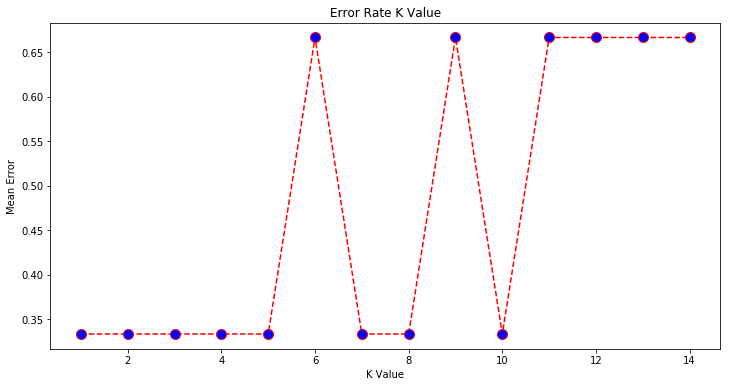

In [408]:
error = []

# Calculating error for K values
for i in range(1, len(dataset)):  
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train, Y_train)
    pred_i = knn.predict(X_test)
    error.append(np.mean(pred_i != Y_test))
    
plt.figure(figsize=(12, 6))  
plt.plot(range(1, len(dataset)), error, color='red', linestyle='dashed', marker='o',  
         markerfacecolor='blue', markersize=10)
plt.title('Error Rate K Value')  
plt.xlabel('K Value')  
plt.ylabel('Mean Error')  